# The Anatomy of Baldness: Statistical & Machine Learning Perspectives on Key Factors of Hair Loss

## 0. Background

### 0.1. Introduction
Hair loss is a growing health concern that affects both appearance and overall well-being for many individuals. Gaining insights into the factors that contribute to its occurrence is essential for the development of personal health management, medical interventions, and related industries.

This report analyzes survey data on potential contributors to hair loss, with a focus on three specific objectives:
|                |  
|:---------------|               
|Explore the characteristics of surveyed individuals.| 
|Examine the relationships between hair loss and its factors.| 
|Determine key predictors of hair loss through machine learning models. |
|  | 

### 0.2. Data Used
The dataset contains a total of 999 rows of observations, each of which represents a single respondent. The table below provides a list of variables and their corresponding descriptions:

|    Variable          | Description                                                                                                           |
|:------------------|:------------------------------------------------------------------------------------------------------------------------|
|Id	|A unique identifier for each person.|
|Genetics|	Whether the person has a family history of baldness.|
|Hormonal Changes|	Indicates whether the individual has experienced hormonal changes (Yes/No).|
|Medical Conditions|	Medical history that may lead to baldness; alopecia areata, thyroid problems, scalp infections, psoriasis, dermatitis, etc.|
|Medications & Treatments|	History of medications that may cause hair loss; chemotherapy, heart medications, antidepressants, steroids, etc.|
|Nutritional Deficiencies|	Lists nutritional deficiencies that may contribute to hair loss, such as iron deficiency, vitamin D deficiency, biotin deficiency, omega-3 fatty acid deficiency, etc.|
|Stress|	Indicates the stress level of the individual (Low/Moderate/High).|
|Age|	Represents the age of the individual.|
|Poor Hair Care Habits|	Indicates whether the individual practices poor hair care habits (Yes/No).|
|Environmental Factors|	Indicates whether the individual is exposed to environmental factors that may contribute to hair loss (Yes/No).|
|Smoking|	Indicates whether the individual smokes (Yes/No).|
|Weight Loss|	Indicates whether the individual has experienced significant weight loss (Yes/No).|
|Hair Loss|	Binary variable indicating the presence (1) or absence (0) of baldness in the individual.|

In [2]:
# Load pre-installed, required packages
suppressPackageStartupMessages(library(tidyverse))
suppressPackageStartupMessages(library(dplyr))
suppressPackageStartupMessages(library(ggplot2))
suppressPackageStartupMessages(library(plotly))
suppressPackageStartupMessages(library(scales))
suppressPackageStartupMessages(library(readr))
suppressPackageStartupMessages(library(DT))

# Install and load the 'ggthemes' package
suppressWarnings(suppressMessages(install.packages("ggthemes", quite=TRUE)))
suppressPackageStartupMessages(library(ggthemes))

# Read the 'Predict Hair Fall' dataset
data <- read_csv("data/Predict Hair Fall.csv", show_col_types=FALSE)

# Encode data types and factors
data <- data %>%
	mutate(Id = as.integer(Id),
		   Age = as.integer(Age),
		   across(where(is.character), as.factor),
		   Stress = factor(Stress, levels=c("Low", "Moderate", "High"), ordered=TRUE),
		   `Hair Loss` = as.factor(`Hair Loss`)
		   )

# Backup original dataset
data1 <- read_csv("data/Predict Hair Fall.csv", show_col_types=FALSE)

# Function to install missing packages
install_if_missing <- function(p) {
  if (!require(p, character.only = TRUE)) {
    suppressWarnings(suppressMessages(install.packages(p, dependencies = TRUE)))
    suppressPackageStartupMessages(library(p, character.only = TRUE))
  }
}

# Function to tabularize summary statistics of a given variable in the dataset
summarize_variable <- function(data, variable=NULL, caption=NULL, dom="t", searching=FALSE, rownames=FALSE, pageLength=10) {
  if (is.null(variable)) {
    datatable(data, 
                  class="cell-border stripe", 
                  options = list(dom=dom, searching=searching, pageLength=pageLength),
                  rownames=rownames,
                  caption=if (!is.null(caption)) htmltools::tags$caption(
                    style = 'caption-side: top; text-align: center;',
                    caption
                  ) else NULL)
  } else {
	summarized_data <- data %>%
      filter(!!sym(variable) != "No Data") %>%
      group_by(!!sym(variable)) %>%
      summarise(Count = n(), .groups="drop") %>%
      {
        if (is.ordered(data[[variable]])) {
          arrange(., desc(!!sym(variable)))
        } else {
          arrange(., desc(Count))
        }
      } %>%
      mutate(Percentage = label_percent(accuracy=0.01)(Count/sum(Count)))
    
    datatable(summarized_data %>% rename(!!variable := !!sym(variable)),
                  class="cell-border stripe", 
                  options = list(dom=dom, searching=searching, pageLength=pageLength),
			      rownames=rownames,
                  caption=if (!is.null(caption)) htmltools::tags$caption(
                    style = 'caption-side: top; text-align: center;',
                    caption
                  ) else NULL)
  }
}
			  
# Function to check if a package is installed, and install it if not
install_if_missing <- function(package) {
  if (!require(package, character.only = TRUE)) {
    install.packages(package, dependencies = TRUE)
    library(package, character.only = TRUE)
  }
}
			  
# Function to create a propotional stack bar plot (used for subplots of multiple variables)
create_plotly_stackbar <- function(data = data, var, showlegend=FALSE, yaxis_text=NULL, yaxis_titleSize=11.5, yaxis_tickSize=10, tickangle=0) {
  yaxis_title <- ifelse(is.null(yaxis_text), var, yaxis_text)
  
  plot_data <- as.data.frame(table(data %>% filter(!!sym(var) != "No Data") %>%
								   		select(`Hair Loss`, all_of(var)))) %>%
    rename_with(~ gsub("\\.", " ", .)) %>%
	group_by(!!sym(var)) %>%
    mutate(Percentage = 100*Freq/sum(Freq),
           `Hair Loss` = ifelse(`Hair Loss` == 1, "With baldness", "Without baldness")
          ) %>%
    rename(Count = Freq)
  
  plot <- plot_ly(
    data = plot_data,
    x = ~Percentage,
    y = as.formula(paste0("~`", var, "`")),
    type = "bar",
    color = ~`Hair Loss`,
    colors = c("#FF6347", "#8c8c8c"),
    showlegend = showlegend,
    text = ~paste0("<b>Percentage:</b> ", label_percent(accuracy=0.01)(Percentage/100), "\n<b>Count:</b> ", Count),
    hoverinfo = "text"
  ) %>%
    layout(
      xaxis = list(title = list(text="Percentage (%)", font = list(family="ITC Officina Sans", size=18))),
      yaxis = list(title = list(text = paste("\n<b>", yaxis_title, "</b>"),
								font = list(family="ITC Officina Sans", size = yaxis_titleSize), 
								standoff=43),
                   tickfont = list(family="ITC Officina Sans", size = yaxis_tickSize), tickangle=tickangle
				  ),
      barmode="stack",
      legend = list(orientation="h", xanchor="center", x=0.438, y=1.11, traceorder="normal",
					font = list(family="ITC Officina Sans", size=15)),
	  font = list(size = 14),
	  hoverlabel = list(font = list(family="ITC Officina Sans", size=15))
    )
  
  return(plot)
}			  
			  
# Function to create a data frame for contingency table of a variable			  
create_contingency_data <- function(data, var) {
	
  # Select relevant columns and filter out "No Data" values
  selected_data <- data %>% 
    select(`Hair Loss`, all_of(var)) %>%
    filter(!!sym(var) != "No Data")
  
  # Create contingency table
  contingency_data <- data.frame(matrix(
    with(selected_data, table(selected_data[[var]], `Hair Loss`)),
    nrow = dim(with(selected_data, table(selected_data[[var]], `Hair Loss`)))[1], 
    dimnames = dimnames(with(selected_data, table(selected_data[[var]], `Hair Loss`)))
  ))
  
  return(contingency_data)
}
			  
# Function to create stack bar plot for a variable
create_stackbar_plot1 <- function(data, var, yaxis_title, yaxis_text=NULL, plot_title=NULL, tickangle=45) {
  stackbar_data <- data %>% filter(!!sym(var) != "No Data") %>%
    mutate(!!sym(var) := factor(!!sym(var),
								levels = rownames(create_contingency_data(data, var) %>% 
                                                    mutate(X01 = X0+X1, X0 = X0/X01, X1 = X1/X01) %>%
													arrange(X1, desc(rownames(.)))
												 )
    ))
  
  plot <- create_plotly_stackbar(data = stackbar_data, 
								 var = var, 
								 showlegend=TRUE,
								 yaxis_text = yaxis_text,
								 yaxis_titleSize=20,
								 yaxis_tickSize=15,
								 tickangle = tickangle)
  
  plot %>%
    layout(
      plot_bgcolor = "#D5E4EB",
      paper_bgcolor = "#D5E4EB",
      title = list(text = plot_title, 
                   font = list(family = "ITC Officina Sans", size = 18), 
                   y = 0.93),
      margin = list(t = 95),
      xaxis = list(tickfont = list(family = "ITC Officina Sans", size = 15))
    )
}			  

# Function to create a contingency table of a variable				  
create_contingency_table <- function(data, var, first_colname=var) {
  # Append the proportion to each value in the dataframe
  data <- as.data.frame(
    apply(data %>% arrange(desc(X1)), c(1, 2), function(x) {
      percentage <- label_percent(accuracy=0.01)(x / sum(data))
      sprintf("%d (%s)", x, percentage)
    })
  ) %>%
    rownames_to_column(var=first_colname) 
  
  # Rename rows and columns
  colnames(data) <- c(first_colname, "Without baldness", "With baldness")
  
  # Reorder columns
  data <- data[,c(first_colname, "With baldness", "Without baldness")]								
  
  return(data)
}
			  
# Function to compute Point-Biserial Correlation
compute_point_biserial <- function(data, x, y, conf=0.95) {
  # Ensure the x and y are in the data
  if (!(x %in% colnames(data)) | !(y %in% colnames(data))) {
    stop("The variable x or y not found in the data.")
  }
  
  # Ensure the y contains only the specified values
  unique_y <- unique(data[[y]])
  if (length(unique_y) != 2) {
    stop("The variable y is not binary.")
  }
  
  # Extract values for individuals with and without the binary outcome
  with_group <- data[[x]][data[[y]] == 1]
  without_group <- data[[x]][data[[y]] == 0]
  
  # Calculate means
  X1 <- mean(with_group)
  X0 <- mean(without_group)
  
  # Calculate standard deviation of the entire x data
  sn <- sd(data[[x]])
  
  # Calculate sample sizes
  n1 <- length(with_group)
  n0 <- length(without_group)
  n <- n1 + n0
  
  # Compute the point biserial correlation coefficient
  rpb <- (X1 - X0) / sn * sqrt((n1 * n0) / (n^2))
  
  # Compute confidence intervals using cor.test
  rpb_cortest <- cor.test(data[[x]], data[[y]], conf.level=conf)
  lower_ci <- rpb_cortest$conf.int[1]
  upper_ci <- rpb_cortest$conf.int[2]
  
  rpb_df <- data.frame(x=x, y=y, X1=X1, X0=X0, rpb=rpb, lower_ci=lower_ci, upper_ci=upper_ci
                      ) %>%
    mutate(across(where(is.numeric) & !where(is.integer), ~ ifelse(abs(.) >= 0.01, 
                                          label_number(accuracy = 0.01)(.), 
                                          label_scientific(digits = 3)(.)))
    ) %>%
    rename(`Correlation coefficient` = rpb) %>%
	mutate(!!paste0(conf * 100, "% CI") := paste0("[", lower_ci, ", ", upper_ci, "]"),
		   Method="Point-biserial") %>%
	select(-c("lower_ci", "upper_ci"))
  
  return(rpb_df)
}			

# Function to compute Rank-Biserial Correlation
compute_rank_biserial <- function(data, x, y, o=0, l=1, conf=0.95) {
  # Install and load the 'rcompanion' package if not already installed
  if (!requireNamespace("rcompanion", quietly = TRUE)) {
    suppressWarnings(suppressMessages(install.packages("rcompanion", quiet=TRUE)))
  }
  suppressPackageStartupMessages(library(rcompanion))
  
  # Ensure the x and y are in the data
  if (!(x %in% colnames(data)) | !(y %in% colnames(data))) {
    stop("The variable x or y not found in the data.")
  }
  
  # Ensure the y contains only the specified values
  unique_y <- unique(data[[y]])
  if (length(unique_y) != 2) {
    stop("The variable y is not binary.")
  }
    
  # Rank the predictor variable
  data$ranked_factor <- rank(data[[x]], ties.method = "average") 
  with_group <- data$ranked_factor[data[[y]] == 1]
  without_group <- data$ranked_factor[data[[y]] == 0]	
	
  # Calculate mean ranks for individuals with and without the binary outcome
  R1 <- mean(with_group)
  R0 <- mean(without_group)
 
  # Compute outputs using the wilcoxonRG function
  group <- factor(c(rep("With group", length(with_group)), rep("Without group", length(without_group))))	
  rrb_wilcoxonRG <- wilcoxonRG(x = c(with_group, without_group), g = group, ci=TRUE, conf=conf)
	
  # Extract coefficient and confidence intervals
  rrb <- rrb_wilcoxonRG[[1]]
  lower_ci <- rrb_wilcoxonRG[[2]]
  upper_ci <- rrb_wilcoxonRG[[3]]
  
  rrb_df <- data.frame(x=x, y=y, R1=R1, R0=R0, rrb=rrb, lower_ci=lower_ci, upper_ci=upper_ci
					  ) %>%
    mutate(across(where(is.numeric) & !where(is.integer), ~ ifelse(abs(.) >= 0.01, 
                                          label_number(accuracy = 0.01)(.), 
                                          label_scientific(digits = 3)(.)))
    ) %>%
    rename(`Correlation coefficient` = rrb) %>%
	mutate(!!paste0(conf * 100, "% CI") := paste0("[", lower_ci, ", ", upper_ci, "]"),
		   Method="Rank-biserial") %>%
	select(-c("lower_ci", "upper_ci")) 
  
  return(rrb_df)
}

# Function to compute Phi Coefficient
compute_phi <- function(data, x, y, o=0, l=1, u, t, conf=0.95) {
  # Install and load the 'statpsych' package if not already installed
  if (!requireNamespace("statpsych", quietly = TRUE)) {
    suppressWarnings(suppressMessages(install.packages("statpsych", quiet=TRUE)))
  }
  suppressPackageStartupMessages(library(statpsych))
  
  # Ensure the x and y are in the data
  if (!(x %in% colnames(data)) | !(y %in% colnames(data))) {
    stop("The variable x or y not found in the data.")
  }
  
  # Ensure the x and y contain only binary values
  unique_x <- unique(data[[x]])
  unique_y <- unique(data[[y]])
  if (length(unique_x) != 2 | length(unique_y) != 2) {
    stop("The variables x and y must be binary.")
  }
  
  # Create contingency table
  contingency_table <- table(data[[x]], data[[y]])
  
  # Convert o, l, u, t to character
  o <- as.character(o)
  l <- as.character(l)
  u <- as.character(u)
  t <- as.character(t)
  
  # Extract counts from the contingency table using provided levels
  a <- contingency_table[t, l]
  b <- contingency_table[t, o]
  c <- contingency_table[u, l]
  d <- contingency_table[u, o]
  
  # Compute outputs using the function ci.phi
  ci_phi <- ci.phi(alpha = 1-conf, d, c, b, a)
  
  # Compute confidence interval limits
  phi <- ci_phi[[1]]
  ci_lower <- ci_phi[[3]]
  ci_upper <- ci_phi[[4]]
  
  # Create a dataframe to return the results
  phi_df <- data.frame(x = x, y = y, counts=paste(a,b,c,d, sep=", "), phi = phi, 
                       ci = paste0("[", round(ci_lower, 2), ", ", round(ci_upper, 2), "]")) %>%
    mutate(across(where(is.numeric) & !where(is.integer), ~ ifelse(abs(.) > 0.01, 
                                                                  label_number(accuracy = 0.01)(.), 
                                                                  label_scientific(digits = 3)(.)))
    ) %>%
    rename(`a, b, c, d` = counts,
           `Phi coefficient` = phi,
		   !!paste0(conf * 100, "% CI") := ci)
  
  return(phi_df)
}		

# Function to compute Cramer's V
compute_cramersV <- function(data, x, y, conf=0.95) {
  # Ensure the x and y are in the data
  if (!(x %in% colnames(data)) | !(y %in% colnames(data))) {
    stop("The variable x or y not found in the data.")
  }
  
  # Create contingency table
  contingency_table <- table(data[[x]], data[[y]])
  
  # Compute chi-square statistic
  chi2 <- chisq.test(contingency_table, simulate.p.value = TRUE)$statistic
  
  # Get the number of rows and columns in the contingency table
  n <- sum(contingency_table)
  r <- nrow(contingency_table)
  c <- ncol(contingency_table)
  rc <- paste(r, c, sep=", ")	
  
  # Compute outputs using the cramerV function
  cramersV <- cramerV(contingency_table, ci=TRUE, conf=conf)
  
  # Extract coefficient and confidence intervals
  cramers_v <- cramersV[[1]]
  lower_ci <- cramersV[[2]]
  upper_ci <- cramersV[[3]]
  
  # Create a dataframe to return the results
  cramers_v_df <- data.frame(
    n = n, 
    rc = rc, 
    x = x, 
    y = y, 
    chi2 = chi2, 
    cramers_v = cramers_v, 
    lower_ci = lower_ci, 
    upper_ci = upper_ci
  ) %>%
    mutate(across(
      where(is.numeric) & !where(is.integer), 
      ~ ifelse(abs(.) > 0.01, label_number(accuracy = 0.01)(.), label_scientific(digits = 3)(.))
    )) %>%
    rename(
      `Chi-square statistic` = chi2,
      `r, c` = rc,
      `Cramer's V` = cramers_v
    ) %>%
    mutate(!!paste0(conf * 100, "% CI") := paste0("[", lower_ci, ", ", upper_ci, "]")) %>%
    select(-c("lower_ci", "upper_ci"))
  
  rownames(cramers_v_df) <- c(1:nrow(cramers_v_df))
  
  return(cramers_v_df)
}
			
# Function for evaluating model performance
evaluate_model <- function(model, test, y, model_name) {
  
  # Check if pROC package is installed, if not, install it
  if (!requireNamespace("pROC", quietly = TRUE)) {
    install.packages("pROC")
  }
  suppressPackageStartupMessages(library(pROC))
  
  # Perform predictions using the model and test data
  prob <- predict(model, test, type = "prob")[, 2]
  predicted <- predict(model, test)
  
  # Create a confusion matrix to evaluate the model's performance
  conf_matrix <- confusionMatrix(predicted, test[[y]])
  
  # Compute model metrics
  roc <- roc(test[[y]], prob)
  auc <- auc(roc)
  accuracy <- conf_matrix$overall['Accuracy']
  precision <- conf_matrix$byClass['Pos Pred Value']
  recall <- conf_matrix$byClass['Sensitivity']
  f1 <- 2 * (precision * recall) / (precision + recall)
  
  # Return performance metrics as a dataframe
  results <- data.frame(
    AUC = round(auc, 4),
    Accuracy = round(accuracy, 4),
    Precision = round(precision, 4),
    Recall = round(recall, 4),
    f1 = round(f1, 4)
  ) %>%
  rename(`F1 Score` = f1)
  
  rownames(results) <- model_name
  
  return(results)
}			  
			  		  
# Function for cluster statistics
cstats.table <- function(dist, tree, k) {
clust.assess <- c("cluster.number","n","within.cluster.ss","average.within","average.between",
                  "wb.ratio","dunn2","avg.silwidth")
clust.size <- c("cluster.size")
stats.names <- c()
row.clust <- c()
output.stats <- matrix(ncol = k, nrow = length(clust.assess))
cluster.sizes <- matrix(ncol = k, nrow = k)
for(i in c(1:k)){
  row.clust[i] <- paste("Cluster-", i, " size")
}
for(i in c(2:k)){
  stats.names[i] <- paste("Test", i-1)
  
  for(j in seq_along(clust.assess)){
    output.stats[j, i] <- unlist(cluster.stats(d = dist, clustering = cutree(tree, k = i))[clust.assess])[j]
    
  }
  
  for(d in 1:k) {
    cluster.sizes[d, i] <- unlist(cluster.stats(d = dist, clustering = cutree(tree, k = i))[clust.size])[d]
    dim(cluster.sizes[d, i]) <- c(length(cluster.sizes[i]), 1)
    cluster.sizes[d, i]
    
  }
}
output.stats.df <- data.frame(output.stats)
cluster.sizes <- data.frame(cluster.sizes)
cluster.sizes[is.na(cluster.sizes)] <- 0
rows.all <- c(clust.assess, row.clust)
output <- rbind(output.stats.df, cluster.sizes)[ ,-1]
colnames(output) <- stats.names[2:k]
rownames(output) <- rows.all
is.num <- sapply(output, is.numeric)
output[is.num] <- lapply(output[is.num], round, 2)
output
}			  		  
			  		  
# Tabularize first five rows of the dataset			  
summarize_variable(slice(data, 1:5), dom="t")		  

HTML widgets cannot be represented in plain text (need html)

### 0.3. Executive Summary  
- The surveyed individuals are, on average, **34 years old**, with their **ages evenly distributed** between 18 to 50 years.  
- **Alopecia areata** emerges as the most common medical condition associated with baldness, consistent with its established medical background. Other notable conditions include **psoriasis, thyroid problems, androgenetic alopecia, and dermatitis**, each reported by approximately **one-third of the 889 individuals** with documented medical conditions.  
- Among the **919 respondents** with data on nutritional deficiencies, **zinc and vitamin D** deficiencies are the most prevalent. **Biotin, omega-3 fatty acids, and vitamin A** deficiencies also rank in the top five, each reported by **at least 10% of these respondents**.  
- **Middle-aged** individuals, aged **31–45 years**, constitute the **largest proportion** of those who have **experienced baldness**.  
- Hair loss exhibits **near-zero associations** with all factors, indicating that it results from a **combination of multiple factors rather than a single one**.  
- **Stress levels**—categorized as low, moderate, and high—are found to be **evenly distributed** among individuals **with and without baldness**.  
- Among the three classification models evaluated, a **random forest** model, which demonstrates an initial **AUC score of ~0.58** and an **accuracy of ~0.59**, is recommended for **further tuning and optimization**.  
- **Cluster analysis** identifies **two groups** of individuals with **shared key underlying features** related to hair loss, including **scalp infection, psoriasis, androgenetic alopecia, hormonal changes**, and the use of **immunomodulators**.  
- Through the importance analysis of the model, **stress, age, and smoking** are identified as major predictors of hair loss, while several features related to **lifestyle and medical history** are found to have **considerable influence** on the model's predictive performance.  
<br><br>  

## 1. Descriptive Analysis  
This section provides an overview of the characteristics of the surveyed individuals using summary statistics, focusing on age, medical history, stress, and lifestyle factors.  

### 1.1. Age  
- **Range**: The youngest individual in the survey is 18 years old, and the oldest is 50 years old.  
- **1st Quartile (Q1)**: Twenty-five percent of respondents are younger than 26 years.  
- **Mean**: The average age of the respondents is 34.19 years.  
- **Median (Q2)**: Half of the individuals are younger (or older) than 34 years. This value is nearly the same as the mean, indicating a relatively symmetrical distribution of ages among the respondents.  
- **3rd Quartile (Q3)**: Seventy-five percent of the surveyed individuals are younger than 42 years.  
- **Standard Deviation**: 9.38 years, indicating a moderate spread of ages around the mean.  
- **Skewness**: -0.03, indicating a nearly symmetrical age distribution with no significant skew toward younger or older groups.

In [3]:
# Install and load the 'moments' package for calculating skewness
suppressWarnings(suppressMessages(install.packages("moments", quiet=TRUE)))
suppressPackageStartupMessages(library(moments))

# Summary statistics of the age
age_stats <- data.frame(Value = unclass(summary(data$Age))) %>%
  bind_rows(data.frame(Value = c(sd(data$Age), skewness(data$Age)), row.names = c("Std. Dev.", "Sk\u209a"))) %>%
  mutate_if(is.numeric, round, 2)

# Age distribution plot
age_dist_plot <- ggplot(data, aes(x = Age, text = paste0("<b>Count:</b> ", after_stat(count)))) +
  geom_histogram(breaks = hist(data$Age, breaks="FD", plot = FALSE)$breaks) +
  geom_vline(aes(xintercept = mean(Age), text = paste0("<b>Mean: </b>", round(mean(Age), 2))), col="#FFA53E", linewidth=0.5) +
  geom_vline(aes(xintercept = median(Age), text = paste0("<b>Median: </b>", round(median(Age), 2))), col="#4C6DB4", linewidth=0.5) +
  theme_economist() + 
  scale_color_economist() +
  scale_x_continuous(breaks = seq(15, 50, by=5)) +
  ggtitle("\nFIG. 1﹕HISTOGRAM OF THE AGE DISTRIBUTION OF SURVEYED INDIVIDUALS") +
  theme(
    plot.title = element_text(size=13, hjust=0.5),
    axis.title.x = element_text(family="ITC Officina Sans", size=13),
    axis.title.y = element_text(family="ITC Officina Sans", size=13)
  ) +
  labs(y="Count")

# Convert ggplot to plotly
age_dist_plotly <- ggplotly(age_dist_plot, tooltip=c("text")) %>%
  layout(
    hoverlabel = list(font = list(family="ITC Officina Sans", size=15)),
    xaxis = list(tickfont = list(family="ITC Officina Sans", size=13)),
    yaxis = list(tickfont = list(family="ITC Officina Sans", size=13))
  ) %>%
  add_annotations(
    text = paste0(
      "<b>Std. Deviation (<i>\u03c3</i>): </b>", round(sd(data$Age), 2), 
      ";  <b>Skewness (<i>Sk\u209a</i>): </b>", round(skewness(data$Age), 2)
    ),
    x = 0.037, y = 0.97, xref = "paper", yref = "paper",
    showarrow = FALSE, font = list(family="ITC Officina Sans", size=13.5), align="left"
  )

Warning message in geom_vline(aes(xintercept = mean(Age), text = paste0("<b>Mean: </b>", :
“Ignoring unknown aesthetics: text”
Warning message in geom_vline(aes(xintercept = median(Age), text = paste0("<b>Median: </b>", :
“Ignoring unknown aesthetics: text”


In [4]:
age_dist_plotly

HTML widgets cannot be represented in plain text (need html)

### 1.2. Medical History  

This report defines an individual’s medical history as their medical background and experiences, particularly those related to hair loss. The following statistics highlight key characteristics of the respondents' medical histories:  

- **Genetics:** A total of 52.25% of respondents reported having a family history of baldness.  
- **Hormonal Changes:** Approximately 51% of respondents have experienced hormonal changes.  
- **Medical Conditions:** Among the 889 individuals with recorded medical conditions potentially leading to baldness, alopecia areata is the most common, affecting 12.04% of the group. It is followed by psoriasis (11.25%), thyroid problems (11.14%), and androgenetic alopecia (11.02%). Dermatitis (10.35%) also ranks highly, rounding out the top five conditions.

In [5]:
# Tabularize summary statistics of Genetics
summarize_variable(
  data = data %>% rename(`Has a family history of baldness` = Genetics),
  variable = "Has a family history of baldness",
  rownames = FALSE
)

HTML widgets cannot be represented in plain text (need html)

In [6]:
# Tabularize summary statistics of Hormonal Changes
summarize_variable(
  data %>% rename(`Has experienced hormonal changes` = `Hormonal Changes`),
  variable = "Has experienced hormonal changes",
  rownames = FALSE
)

HTML widgets cannot be represented in plain text (need html)

In [7]:
# Tabularize summary statistics of Medical Conditions
summarize_variable(
  data = data %>% rename(`Medical condition that may lead to baldness` = `Medical Conditions`),
  variable = "Medical condition that may lead to baldness",
  dom = "tip",
  pageLength = 5
)

HTML widgets cannot be represented in plain text (need html)

- **Medications & Treatments:** **Rogaine** is the most commonly used medication or treatment associated with hair loss among the respondents, with 11.63% reporting its use. It is followed by antidepressants (11.03%), steroids (10.73%), heart medication (10.43%), and Accutane (10.23%).

In [8]:
# Tabularize summary statistics of Medications & Treatments
summarize_variable(
  data = data %>% rename(`Medication or treatment that may cause hair loss` = `Medications & Treatments`),
  variable = "Medication or treatment that may cause hair loss",
  dom = "tip",
  pageLength = 5
)

HTML widgets cannot be represented in plain text (need html)

- **Nutritional Deficiencies:** Most of the documented 919 individuals with nutritional deficiencies that may contribute to hair loss are zinc deficient (11.75%). Vitamin D deficiency follows closely at 11.32%, while both Biotin and vitamin A deficiencies impact 10.77% each. The deficiency of omega-3 fatty acids completes the top five, affecting 10.01% of the group.

In [9]:
# Tabularize summary statistics of Nutritional Deficiencies
summarize_variable(
  data %>% rename(`Nutritional deficiency that may contribute to hair loss` = `Nutritional Deficiencies`),
  variable = "Nutritional deficiency that may contribute to hair loss",
  dom = "tip",
  pageLength = 5
)

HTML widgets cannot be represented in plain text (need html)

### 1.3. Stress  

Stress levels among respondents are found to be almost evenly distributed, with 32.73% reporting low stress, 35.14% experiencing moderate stress, and 32.13% dealing with high stress.  

### 1.4. Lifestyle  

In this report, lifestyle factors are defined as various habits and behaviors that may influence hair loss. The statistics below provide an overview of key lifestyle traits among the respondents:  

- **Poor Hair Care Habits:** Nearly half (49.25%) of the respondents reported engaging in poor hair care practices.  
- **Environmental Factors:** A total of 50.85% indicated exposure to environmental factors associated with hair loss.  
- **Smoking:** Approximately 52% of the respondents are identified as smokers.  
- **Weight Loss:** Significant weight loss is reported by 47.25% of the respondents.  
<br><br>

## 2. Measures of Association

In [10]:
# Tabularize summary statistics of Stress
summarize_variable(
  data %>% 
    mutate(
      Stress = factor(Stress, levels = c("High", "Moderate", "Low"), ordered = TRUE)
    ) %>%
    rename(`Stress level` = Stress),
  variable = "Stress level",
  rownames = FALSE
)

HTML widgets cannot be represented in plain text (need html)

In [11]:
# Tabularize summary statistics of Poor Hair Care Habits
summarize_variable(
  data %>%
    rename(
      `Practices poor hair care habits` = `Poor Hair Care Habits`
    ),
  variable = "Practices poor hair care habits",
  rownames = FALSE
)
			  
# Tabularize summary statistics of Environmental Factors
summarize_variable(
  data %>%
    rename(
      `Exposed to environmental factors that may contribute to hair loss` = `Environmental Factors`
    ),
  variable = "Exposed to environmental factors that may contribute to hair loss",
  rownames = FALSE
)
			  
# Tabularize summary statistics of Smoking
summarize_variable(
  data,
  variable = "Smoking",
  rownames = FALSE
)
			  
# Tabularize summary statistics of Weight Loss
summarize_variable(
  data %>%
    rename(
      `Has experienced significant weight loss` = `Weight Loss`
    ),
  variable = "Has experienced significant weight loss",
  rownames = FALSE
)	
					  
# Tabularize summary statistics of Hair Loss
summarize_variable(
  data %>%
    mutate(
      `Hair Loss` = ifelse(`Hair Loss` == 1, "Yes", "No"),
      `Hair Loss` = factor(`Hair Loss`, levels = c("No", "Yes"), ordered = TRUE)
    ) %>%
    rename(`With baldness` = `Hair Loss`),
  variable = "With baldness",
  rownames = FALSE
)

HTML widgets cannot be represented in plain text (need html)

HTML widgets cannot be represented in plain text (need html)

HTML widgets cannot be represented in plain text (need html)

HTML widgets cannot be represented in plain text (need html)

HTML widgets cannot be represented in plain text (need html)

In [12]:
# Data frame for the pie graph, by Hair Loss
hair_loss <- data %>%
  select(`Hair Loss`) %>%
  group_by(`Hair Loss`) %>%
  summarise(Count = n(), .groups="drop") %>% 
  mutate(Proportion = Count/sum(Count)) %>%
  arrange(desc(`Hair Loss`), desc(Count))

# Factorize the Hair Loss variable
hair_loss$`Hair Loss` <- factor(hair_loss$`Hair Loss`, levels=c(0, 1))

# Create a pie graph for hair loss experience
hair_loss_pie <- plot_ly(
  type="pie",
  labels=paste0("<b>",ifelse(hair_loss$`Hair Loss` == 1, "With baldness", "Without baldness"),"</b>"),
  values = hair_loss$Count,
  textinfo="label",
  textposition="inside",
  hoverinfo="text",
  hovertext = paste0(
    "<b>Percentage:</b> ", label_percent(accuracy=0.01)(hair_loss$Proportion),
    "<b>\nCount:</b> ", hair_loss$Count
  ),
  marker = list(
    colors = case_when(
      hair_loss$`Hair Loss`==1 ~ "#FF6347",
      hair_loss$`Hair Loss`==0 ~ "#8c8c8c"
    )
  ),
  textfont = list(
    family="ITC Officina Sans",
    size=18,
    color="white"
  )
) %>%
  layout(
    title = list(
      text="𝗙𝗜𝗚. 𝟮﹕𝗣𝗜𝗘 𝗚𝗥𝗔𝗣𝗛 𝗢𝗙 𝗧𝗛𝗘 𝗦𝗨𝗥𝗩𝗘𝗬𝗘𝗗 𝗜𝗡𝗗𝗜𝗩𝗜𝗗𝗨𝗔𝗟𝗦\n𝗕𝗬 𝗛𝗔𝗜𝗥 𝗟𝗢𝗦𝗦 𝗢𝗨𝗧𝗖𝗢𝗠𝗘",
      font = list(size=18)
    ),
    paper_bgcolor="#D5E4EB",
    margin = list(l=0, r=0, b=20, t=80),
    showlegend = FALSE  # Hide the legend
  ) %>%
  style(
    hoverlabel = list(
      font = list(
        family="ITC Officina Sans",
        size=15
      )
    )
  )

hair_loss_pie

HTML widgets cannot be represented in plain text (need html)

The pie graph in Figure 2 illustrates that baldness affects nearly half of the respondents, indicating a balanced dataset in terms of hair loss outcomes. This section explores the distribution of individuals by hair loss outcome across various factor groups. Furthermore, it examines the relationships between hair loss and each specific factor by applying appropriate measures of association.  

Below is a table presenting each factor, its levels of measurement, and the corresponding statistical methods applied for the analysis:  

| Variable | Level of measurement | Measure of association |
|:---------|:---------------------|:-----------------------|
|Age|	Continuous|	Point-biserial correlation|
|Stress|	Ordinal|	Rank-biserial correlation|
|Medical Conditions|	Nominal (>2 categories)|	Cramer's V|
|Medications & Treatments|	Nominal (>2 categories)|	Cramer's V|
|Nutritional Deficiencies|	Nominal (>2 categories)|	Cramer's V|
|Genetics|	Nominal (binary)|	Phi (φ) coefficient|
|Hormonal Changes|Nominal (binary)	|Phi (φ) coefficient|
|Poor Hair Care Habits|	Nominal (binary)|	Phi (φ) coefficient|
|Environmental Factors|	Nominal (binary)|	Phi (φ) coefficient|
|Smoking|	Nominal (binary)|	Phi (φ) coefficient|
|Weight Loss|	Nominal (binary)|	Phi (φ) coefficient|

<br>

### 2.1. Biserial Correlations

**2.1.1 Point-biserial**

For the variable of age, the point-biserial $({r_{pb}})$ correlation is used to measure its association with the binary outcome of hair loss. The correlation coefficient is calculated using the formula:

<div align="center">
	
$$ {r_{pb}} = \frac{\bar{X}_{1} - \bar{X}_{0}}{s_n}\sqrt{\frac{n_0 n_1}{n^2}} $$	

</div>

where:<br>
- ${\bar{X}_{1}}$ is the mean age of the group with baldness (Hair Loss = 1)
- ${\bar{X}_{0}}$ is the mean age of the group without baldness (Hair Loss = 0)
- ${s_n}$ is the standard deviation of the ages
- ${n_1}$ is the number of observations with baldness
- ${n_0}$ is the number of observations without baldness
- ${n}$ is the total number of observations

In [13]:
# Create dataframe for Age Group
age_data <- data %>%
  select(Age, `Hair Loss`) %>%
  mutate(
    `Age Group` = case_when(
      Age >= 17 & Age <= 30 ~ "Young (17-30)",
      Age >= 31 & Age <= 45 ~ "Middle-aged (31-45)",
      Age > 45 ~ "Old (>45)",
      TRUE ~ NA_character_
    ),
    `Age Group` = factor(`Age Group`, levels = c("Young (17-30)", "Middle-aged (31-45)", "Old (>45)"), ordered = TRUE)
  )

# Create contingency table by Age Group and Hair Loss outcome
age_table <- create_contingency_table(create_contingency_data(age_data, "Age Group"), "Age Group")

# Create a boxplot by Age Group and Hair Loss outcome
age_hair_loss_boxplot <- plot_ly(
  data = age_data,
  x = ~factor(`Hair Loss`, labels = c("Without Baldness", "With Baldness")),
  y = ~Age,
  type = "box",
  boxpoints = "outliers", # Show only outliers
  jitter = 0.3, # Add some jitter to the points
  color = ~factor(`Hair Loss`, labels = c("Without Baldness", "With Baldness")), # Add color by Hair Loss
  colors = c('#8c8c8c', '#FF6347') # Define colors
) %>%
  layout(
    title = list(
      text = "\n𝗙𝗜𝗚. 𝟯﹕𝗕𝗢𝗫𝗣𝗟𝗢𝗧 𝗢𝗙 𝗧𝗛𝗘 𝗔𝗚𝗘 𝗗𝗜𝗦𝗧𝗥𝗜𝗕𝗨𝗧𝗜𝗢𝗡 𝗕𝗬 𝗛𝗔𝗜𝗥 𝗟𝗢𝗦𝗦 𝗢𝗨𝗧𝗖𝗢𝗠𝗘",
      font = list(size = 18),
      x = 0.5,
      xanchor = "center",
      y = 0.95,
      yanchor = "top"
    ),
    margin = list(t = 100), # Add margin between title and plot
    xaxis = list(
      title = "Hair Loss Outcome",
      tickfont = list(family = "ITC Officina Sans"),
      titlefont = list(family = "ITC Officina Sans", size = 18),
      showticklabels = FALSE # Do not show x ticks texts
    ),
    yaxis = list(
      title = "Age",
      tickfont = list(family = "ITC Officina Sans"),
      titlefont = list(family = "ITC Officina Sans", size = 18)
    ),
    paper_bgcolor = "#D5E4EB",
    plot_bgcolor = "#D5E4EB",
    legend = list(
      orientation = "h",
      x = 0.5,
      xanchor = "center",
      y = 1.1,
      yanchor = "top"
    )
  ) %>%
  style(
    hoverlabel = list(
      font = list(
        family = "ITC Officina Sans",
        size = 15
      )
    )
  )

age_hair_loss_boxplot

HTML widgets cannot be represented in plain text (need html)

Based on the boxplots in Figure 3, the age distributions of both groups (with and without baldness) are observed to be nearly symmetric, with no indications of outliers. A slight shift of two years between their median to upper quartile ranges is identified, suggesting subtle differences in age-related baldness patterns.

In [14]:
# Data frame for the treemap, by Age Group and by Hair Loss outcome
age_grp_and_hair_loss <- data %>%
  select(Age, `Hair Loss`) %>%
  mutate(
    `Age Group` = case_when(
      Age >= 17 & Age <= 30 ~ "Young (17-30)",
      Age >= 31 & Age <= 45 ~ "Middle-aged (31-45)",
      Age > 45 ~ "Old (>45)",
      TRUE ~ NA_character_
    )
  ) %>%
  group_by(`Hair Loss`, `Age Group`) %>%
  summarise(Count = n(), .groups = "drop") %>%
  mutate(Proportion = Count / sum(Count)) %>%
  arrange(desc(`Hair Loss`), desc(Count))

# Factorize Age Group
age_grp_and_hair_loss$`Age Group` <- factor(
  age_grp_and_hair_loss$`Age Group`,
  levels = c("Young (17-30)", "Middle-aged (31-45)", "Old (>45)"),
  ordered = TRUE
)

# Create a treemap for by Age Group and Hair Loss outcome
colors <- c("#175952", "#762127", "#0b385b", "#01877c", "#ae1726", "#005289")
age_hair_loss_treemap <- plot_ly(
  type = "treemap",
  labels = paste0(
    "<b>", stringr::str_to_sentence(age_grp_and_hair_loss$`Age Group`),
    "\n", ifelse(age_grp_and_hair_loss$`Hair Loss` == 1, "with baldness", "without baldness"), "</b>"
  ),
  parents = rep("", nrow(age_grp_and_hair_loss)),
  values = age_grp_and_hair_loss$Count,
  domain = list(column = 0),
  name = " ",
  hoverinfo = "text",
  hovertext = paste0(
    "<b>Percentage:</b> ", label_percent(accuracy = 0.01)(age_grp_and_hair_loss$Proportion),
    "<b>\nCount:</b> ", age_grp_and_hair_loss$Count
  ),
  marker = list(
    colors = case_when(
      age_grp_and_hair_loss$`Age Group` == "Young (17-30)" & age_grp_and_hair_loss$`Hair Loss` == 1 ~ colors[1],
      age_grp_and_hair_loss$`Age Group` == "Middle-aged (31-45)" & age_grp_and_hair_loss$`Hair Loss` == 1 ~ colors[2],
      age_grp_and_hair_loss$`Age Group` == "Old (>45)" & age_grp_and_hair_loss$`Hair Loss` == 1 ~ colors[3],
      age_grp_and_hair_loss$`Age Group` == "Young (17-30)" & age_grp_and_hair_loss$`Hair Loss` == 0 ~ colors[4],
      age_grp_and_hair_loss$`Age Group` == "Middle-aged (31-45)" & age_grp_and_hair_loss$`Hair Loss` == 0 ~ colors[5],
      age_grp_and_hair_loss$`Age Group` == "Old (>45)" & age_grp_and_hair_loss$`Hair Loss` == 0 ~ colors[6]
    )
  ),
  textfont = list(
    family = "ITC Officina Sans",
    size = 15,
    color = "white"
  ),
  textinfo = "label+text",
  textposition = "middle center"
) %>%
  layout(
    title = list(
      text = "\n𝗙𝗜𝗚. 𝟰﹕𝗧𝗥𝗘𝗘 𝗠𝗔𝗣 𝗢𝗙 𝗧𝗛𝗘 𝗦𝗨𝗥𝗩𝗘𝗬𝗘𝗗 𝗜𝗡𝗗𝗜𝗩𝗜𝗗𝗨𝗔𝗟𝗦 \n𝗕𝗬 𝗔𝗚𝗘 𝗚𝗥𝗢𝗨𝗣 𝗔𝗡𝗗 𝗛𝗔𝗜𝗥 𝗟𝗢𝗦𝗦 𝗢𝗨𝗧𝗖𝗢𝗠𝗘",
      font = list(size = 18)
    ),
    paper_bgcolor = "#D5E4EB",
    margin = list(l = 30, r = 30, b = 25, t = 45)
  ) %>%
  style(
    hoverlabel = list(
      font = list(
        family = "ITC Officina Sans",
        size = 15
      )
    )
  )

age_hair_loss_treemap

HTML widgets cannot be represented in plain text (need html)

Using the age groups defined by Prajapati et al. (2014), which categorize adults as `Young (17-30)`, `Middle-aged (31-45)`, or `Old (>45)`, it can be seen in Figure 4 that among individuals experiencing hair loss, middle-aged adults represent the largest proportion at 0.2412, followed by young adults at 0.1932. Similarly, among those without hair loss, 0.2322 are middle-aged adults, while 0.1842 are young adults.

The distributions of individuals with and without hair loss appear similar, particularly among middle-aged and young adults. However, a significant difference is observed among older adults, where the absence of hair loss is more common than its presence. This indicates a possible negative association between being over 45 and experiencing hair loss.

In [15]:
# Compute point-biserial correlation coefficient between Age and Hair Loss outcome
age_rpb <- compute_point_biserial(
  data1, 
  x = "Age", 
  y = "Hair Loss"
)

# Tabularize results 
summarize_variable(
  age_rpb[, c(1, 3:4, 7, 5, 6)] %>% column_to_rownames("x"), 
  rownames = TRUE
)

HTML widgets cannot be represented in plain text (need html)

Based on the results of a point-biserial correlation, the relationship between age and baldness is found to be inverse, as indicated by the negative coefficient. This means that as age increases, there is a slight tendency for baldness to occur less frequently. However, the coefficient of -0.06 is close to 0, which translates to a very weak relationship.

This suggests that age alone does not strongly influence the likelihood of hair loss in this dataset.
<br><br>

**2.1.1 Rank-biserial**

The rank-biserial correlation is used to measure the relationship between stress levels and hair loss. It is computed using the formula:

<div align="center">
	
$$ {r_{rb}} = 2\frac{R_{1} - R_{0}}{n} $$	

</div>

where:<br>
- ${R_{1}}$ is the mean rank of stress levels for the group with baldness
- ${R_{0}}$ is the mean rank of stress levels for the group without baldness
- ${n}$ is the total number of observations

In [16]:
# Create contingency table for Stress by Hair Loss outcome
stress_table <- create_contingency_table(
  create_contingency_data(data, "Stress"), 
  "Stress"
)

# Data frame for the treemap, by Stress and Hair Loss
stress_lvl_and_hair_loss <- data %>%
	select(Stress, `Hair Loss`) %>%
	group_by(`Hair Loss`, `Stress`) %>%
	summarise(Count = n(), .groups="drop") %>%
	mutate(Proportion = Count/sum(Count)) %>%
	arrange(desc(`Hair Loss`), desc(Count))

# Factorize the Stress variable
stress_lvl_and_hair_loss$Stress <- factor(stress_lvl_and_hair_loss$Stress, levels=c("Low", "Moderate", "High"),
										  ordered=TRUE)

# Create a treemap for by stress level and hair loss experience
colors1 <- c("#567c07", "#996f00", "#a73735", "#77b200", "#e19c00", "#ec3330") 
stress_hair_loss_treemap <- plot_ly(
  type="treemap",
  labels=paste0("<b>",stringr::str_to_sentence(stress_lvl_and_hair_loss$`Stress`)," stress level",
				 "\n",ifelse(stress_lvl_and_hair_loss$`Hair Loss`==1, "with baldness", "without baldness"),"</b>"),
  parents=rep("", nrow(stress_lvl_and_hair_loss)),
  values=stress_lvl_and_hair_loss$Count,
  domain = list(column=0),
  name=" ",
  hoverinfo="text",
  hovertext=paste0(
    "<b>Percentage:</b> ", label_percent(accuracy=0.01)(stress_lvl_and_hair_loss$Count/sum(stress_lvl_and_hair_loss$Count)),
    "<b>\nCount: </b>", stress_lvl_and_hair_loss$Count
  ),
  marker = list(
    colors=case_when(
      stress_lvl_and_hair_loss$`Stress`=="Low" & stress_lvl_and_hair_loss$`Hair Loss`==1 ~ colors1[1],
      stress_lvl_and_hair_loss$`Stress`=="Moderate" & stress_lvl_and_hair_loss$`Hair Loss`==1 ~ colors1[2],
      stress_lvl_and_hair_loss$`Stress`=="High" & stress_lvl_and_hair_loss$`Hair Loss`==1 ~ colors1[3],
      stress_lvl_and_hair_loss$`Stress`=="Low" & stress_lvl_and_hair_loss$`Hair Loss`==0 ~ colors1[4],
      stress_lvl_and_hair_loss$`Stress`=="Moderate" & stress_lvl_and_hair_loss$`Hair Loss`==0 ~ colors1[5],
      stress_lvl_and_hair_loss$`Stress`=="High" & stress_lvl_and_hair_loss$`Hair Loss`==0 ~ colors1[6]
    )
  ),
  textfont = list(
    family="ITC Officina Sans",
    size=15,
    color="white"
  ),
  textinfo="label+text",
  textposition="middle center"
) %>%
  layout(
    title = list(
      text="\n𝗙𝗜𝗚. 𝟱﹕𝗧𝗥𝗘𝗘 𝗠𝗔𝗣 𝗢𝗙 𝗧𝗛𝗘 𝗦𝗨𝗥𝗩𝗘𝗬𝗘𝗗 𝗜𝗡𝗗𝗜𝗩𝗜𝗗𝗨𝗔𝗟𝗦\n𝗕𝗬 𝗦𝗧𝗥𝗘𝗦𝗦 𝗟𝗘𝗩𝗘𝗟 𝗔𝗡𝗗 𝗛𝗔𝗜𝗥 𝗟𝗢𝗦𝗦 𝗢𝗨𝗧𝗖𝗢𝗠𝗘",
      font = list(size=18)
    ),
    paper_bgcolor="#D5E4EB",
    margin = list(l=30, r=30, b=25, t=45)
  ) %>%
  style(
    hoverlabel = list(
      font = list(
        family="ITC Officina Sans",
		size=15
      )
    )
  )

stress_hair_loss_treemap

HTML widgets cannot be represented in plain text (need html)

The treemap shows that the distribution of individuals with and without hair loss is fairly balanced across all stress levels, which suggests that stress may not exhibit a strong association with hair loss.

In [17]:
# Compute rank-biserial correlation coefficients between Stress and Hair Loss outcome
stress_rrb <- compute_rank_biserial(
  data, 
  x = "Stress", 
  y = "Hair Loss"
)

# Tabularize results
summarize_variable(
  stress_rrb[, c(1, 3:4, 7, 5, 6)] %>% column_to_rownames("x"), 
  rownames = TRUE
)

HTML widgets cannot be represented in plain text (need html)

As expected, the rank-biserial correlation results confirm a negligible association (4.81e-05) between stress and baldness, indicating that stress alone does not significantly influence the outcome of hair loss.
<br><br>

### 2.2. Cramer's V

For nominal variables with multiple categories (e.g., medical conditions, medications and treatments, nutritional deficiencies), Cramér's V assesses associations with hair loss, computed as:

<div align="center">
    
$$ V = \sqrt{\frac{\chi^2}{n \cdot \min(r-1, c-1)}}ㅤ;ㅤ\chi^2 = \sum \frac{(O_i - E_i)^2}{E_i}$$

</div>

where:<br>
- ${\chi^2}$ is the chi-square statistic
- ${n}$ is the total number of observations
- $r$ is the number of categories of the factor
- $c$ is the number of categories for hair loss
- $O_i$ is the observed count for category $i$
- $E_i$ is the expected count for category $i$

In [18]:
# Create a contingency table by Medical Conditions and and Hair Loss outcome
medical_conditions_table <- create_contingency_table(
  create_contingency_data(data, "Medical Conditions"), 
  "Medical Conditions", 
  "Medical condition that may lead to baldness"
)

# Create a proportional stacked bar plot by Medical Conditions and Hair Loss outcome
create_stackbar_plot1(
  data1, 
  var = "Medical Conditions", 
  yaxis_text = "\nMedical Condition", 
  tickangle = 0,
  plot_title = "𝗙𝗜𝗚. 𝟲﹕𝗣𝗥𝗢𝗣𝗢𝗥𝗧𝗜𝗢𝗡𝗔𝗟 𝗦𝗧𝗔𝗖𝗞𝗘𝗗 𝗕𝗔𝗥 𝗚𝗥𝗔𝗣𝗛 𝗢𝗙 𝗧𝗛𝗘 𝗦𝗨𝗥𝗩𝗘𝗬𝗘𝗗 𝗜𝗡𝗗𝗜𝗩𝗜𝗗𝗨𝗔𝗟𝗦\n𝗕𝗬 𝗠𝗘𝗗𝗜𝗖𝗔𝗟 𝗖𝗢𝗡𝗗𝗜𝗧𝗜𝗢𝗡 𝗔𝗡𝗗 𝗛𝗔𝗜𝗥 𝗟𝗢𝗦𝗦 𝗢𝗨𝗧𝗖𝗢𝗠𝗘"
)

HTML widgets cannot be represented in plain text (need html)

Alopecia areata, androgenetic alopecia, and seborrheic dermatitis show higher prevalence in the group with baldness, with the former two being known causes of hair loss. In contrast, thyroid problems are more commonly reported by those without baldness.

The distribution is closely balanced across conditions, suggesting that while an individual's medical condition is relevant, it might not be strongly associated with hair loss.

In [19]:
# Create a contingency table for Medications & Treatments
medications_table <- create_contingency_table(
  create_contingency_data(data, "Medications & Treatments"),
  "Medications & Treatments", 
  "Medication or treatment that may cause hair loss"
)

# Create a proportional stacked bar plot for Medications and Treatments and Hair Loss outcome
create_stackbar_plot1(
  data1 %>% rename(`Medications and Treatments` = `Medications & Treatments`),
  var = "Medications and Treatments", 
  yaxis_text = "\nMedication / Treatment", 
  tickangle = 0, 
  plot_title = "𝗙𝗜𝗚. 𝟳﹕𝗣𝗥𝗢𝗣𝗢𝗥𝗧𝗜𝗢𝗡𝗔𝗟 𝗦𝗧𝗔𝗖𝗞𝗘𝗗 𝗕𝗔𝗥 𝗚𝗥𝗔𝗣𝗛 𝗢𝗙 𝗧𝗛𝗘 𝗦𝗨𝗥𝗩𝗘𝗬𝗘𝗗 𝗜𝗡𝗗𝗜𝗩𝗜𝗗𝗨𝗔𝗟𝗦\n𝗕𝗬 𝗠𝗘𝗗𝗜𝗖𝗔𝗧𝗜𝗢𝗡 𝗢𝗥 𝗧𝗥𝗘𝗔𝗧𝗠𝗘𝗡𝗧 𝗔𝗡𝗗 𝗛𝗔𝗜𝗥 𝗟𝗢𝗦𝗦 𝗢𝗨𝗧𝗖𝗢𝗠𝗘"
)

HTML widgets cannot be represented in plain text (need html)

Steroids and antibiotics are more prevalently used among individuals with baldness compared to those without it, whereas immunomodulators are more commonly used by those without baldness. These differences in usage across groups are generally small, which suggests that these medications and treatments are unlikely to be standalone causes of baldness.

In [20]:
# Create a contingency table by Nutritional Deficiencies and Hair Loss outcome
nutritional_deficiencies_table <- create_contingency_table(
  create_contingency_data(data, "Nutritional Deficiencies"),
  "Nutritional Deficiencies",
  "Nutritional deficiency that may contribute to hair loss"
)

# Create a proportional stacked bar plot for Nutritional Deficiencies and Hair Loss outcome
create_stackbar_plot1(
  data1, 
  var = "Nutritional Deficiencies", 
  yaxis_text = "\nNutritional Deficiency", 
  tickangle = 0,
  plot_title = "𝗙𝗜𝗚. 𝟴﹕𝗣𝗥𝗢𝗣𝗢𝗥𝗧𝗜𝗢𝗡𝗔𝗟 𝗦𝗧𝗔𝗖𝗞𝗘𝗗 𝗕𝗔𝗥 𝗚𝗥𝗔𝗣𝗛 𝗢𝗙 𝗧𝗛𝗘 𝗦𝗨𝗥𝗩𝗘𝗬𝗘𝗗 𝗜𝗡𝗗𝗜𝗩𝗜𝗗𝗨𝗔𝗟𝗦\n𝗕𝗬 𝗡𝗨𝗧𝗥𝗜𝗧𝗜𝗢𝗡𝗔𝗟 𝗗𝗘𝗙𝗜𝗖𝗜𝗘𝗡𝗖𝗬 𝗔𝗡𝗗 𝗛𝗔𝗜𝗥 𝗟𝗢𝗦𝗦 𝗢𝗨𝗧𝗖𝗢𝗠𝗘"
)

HTML widgets cannot be represented in plain text (need html)

Magnesium deficiency is more prevalent among individuals with baldness, while omega-3 fatty acids and vitamin E deficiencies skew toward the no-baldness group. Otherwise, the differences across factors are generally small.

The table below illustrates the results of calculating Cramér's _V_, along with observation and category counts, Chi-square statistics, and 95% confidence intervals.

In [21]:
## Compute Cramer's V
# Between Medical Conditions and Hair Loss
med_cons_cramers <- compute_cramersV(
  subset(data1, `Medical Conditions` != "No Data"), 
  x = "Medical Conditions", 
  y = "Hair Loss"
)

# Between Hormonal Changes and Hair Loss
meds_cramers <- compute_cramersV(
  subset(data1, `Medications & Treatments` != "No Data"), 
  x = "Medications & Treatments", 
  y = "Hair Loss"
)

# Between Poor Hair Care Habits and Hair Loss
nutri_defs_cramers <- compute_cramersV(
  subset(data1, `Nutritional Deficiencies` != "No Data"), 
  x = "Nutritional Deficiencies", 
  y = "Hair Loss"
)

# Tabularize results
summarize_variable(
  bind_rows(med_cons_cramers, meds_cramers, nutri_defs_cramers) %>%
    select(-y) %>%
    column_to_rownames("x"),
  rownames = TRUE
)

HTML widgets cannot be represented in plain text (need html)

While these factors show some level of association with hair loss, the relationships are generally weak as indicated by the small Cramer's V values (0.06–0.09).
<br><br>

### 2.3. Phi Coefficient

For hair loss factors indicating specific characteristics using "Yes/No" responses (e.g., genetics, hormonal changes, poor hair care habits, environmental factors, smoking, and weight loss), the phi coefficient examines binary-to-binary relationships with hair loss. The formula is:

<div align="center">
    
$$ \phi = \frac{ad - bc}{\sqrt{(a + b)(c + d)(a + c)(b + d)}} $$

</div>

where $a,b,c,$ and $d$ represent the counts in the contingency table as shown below:

<div align="center">
	
|       | With baldness<br>(Hair Loss = $1$) | Without baldness<br>(Hair Loss = $0$) |
|:-------|:-------:|:-------:|
| **Yes**ㅤ |   $a$  |   $b$  |
| **No** ㅤ|   $c$  |   $d$  |
|       |	
	
</div>

In [22]:
# Create a contingency table by Genetics and Hair Loss outcome
genetics_table <- create_contingency_table(
  create_contingency_data(data, "Genetics"),
  "Genetics",
  "Has a family history of baldness"
)

# Create a contingency table by Hormonal Changes and Hair Loss outcome
hormonal_changes_table <- create_contingency_table(
  create_contingency_data(data, "Hormonal Changes"),
  "Hormonal Changes",
  "Has experienced hormonal changes"
)

## Create proportional stacked bar plots

# Genetics
stackbar_plot1 <- create_plotly_stackbar(
  data, 
  "Genetics", 
  TRUE, 
  "\n\nGenetics\n", 
  yaxis_titleSize = 18, 
  yaxis_tickSize = 15, 
  tickangle = 0
)

# Hormonal Changes
stackbar_plot2 <- create_plotly_stackbar(
  data, 
  "Hormonal Changes", 
  FALSE, 
  "\n\nHormonal Changes\n", 
  yaxis_titleSize = 18, 
  yaxis_tickSize = 15, 
  tickangle = 0
)

# Combine the plots
subplot(stackbar_plot1, stackbar_plot2, nrows = 2, shareX = TRUE, shareY = TRUE) %>%
  layout(
    plot_bgcolor = "#D5E4EB",
    paper_bgcolor = "#D5E4EB",
    title = list(
      text = "𝗙𝗜𝗚. 𝟵﹕𝗣𝗥𝗢𝗣𝗢𝗥𝗧𝗜𝗢𝗡𝗔𝗟 𝗦𝗧𝗔𝗖𝗞𝗘𝗗 𝗕𝗔𝗥 𝗚𝗥𝗔𝗣𝗛 𝗢𝗙 𝗧𝗛𝗘 𝗦𝗨𝗥𝗩𝗘𝗬𝗘𝗗 𝗜𝗡𝗗𝗜𝗩𝗜𝗗𝗨𝗔𝗟𝗦\n𝗕𝗬 𝗚𝗘𝗡𝗘𝗧𝗜𝗖𝗦, 𝗛𝗢𝗥𝗠𝗢𝗡𝗔𝗟 𝗖𝗛𝗔𝗡𝗚𝗘𝗦, 𝗔𝗡𝗗 𝗛𝗔𝗜𝗥 𝗟𝗢𝗦𝗦 𝗢𝗨𝗧𝗖𝗢𝗠𝗘", 
      font = list(family = "ITC Officina Sans", size = 18), 
      y = 0.93
    ),
    margin = list(t = 95),
    xaxis = list(tickfont = list(family = "ITC Officina Sans", size = 15))
  )

HTML widgets cannot be represented in plain text (need html)

- **Genetics:** Among those with a family history of baldness, more individuals have experienced hair loss than those who have not.

- **Hormonal Changes:** The distribution is fairly balanced across hormonal changes and baldness experience groups, indicating no clear link in the dataset.

In [23]:
# Transform data to long format for lifestyle factors
lifestyle_data_long <- data %>%
  select("Id", "Hair Loss", "Poor Hair Care Habits", "Environmental Factors", "Smoking", "Weight Loss") %>%
  tidyr::pivot_longer(
    cols = c("Poor Hair Care Habits", "Environmental Factors", "Smoking", "Weight Loss"),
    names_to = "Factor",
    values_to = "Response"
  ) %>%
  mutate(
    Lifestyle = case_when(
      Factor == "Poor Hair Care Habits" ~ "Practices poor hair care habits",
      Factor == "Environmental Factors" ~ "Exposed to environmental factors that may contribute to hair loss",
      Factor == "Smoking" ~ "Smoking",
      Factor == "Weight Loss" ~ "Has experienced significant weight loss",
      TRUE ~ NA_character_
    )
  )

# Summarize counts and proportions
lifestyle_summ <- lifestyle_data_long %>%
  group_by(`Hair Loss`, Factor, Lifestyle, Response) %>%
  summarise(Count = n(), Proportion = Count / nrow(data), .groups = "drop") %>%
  arrange(Factor)

# Create a contingency table by Poor Hair Care Habits and Hair Loss outcome
hair_care_table <- create_contingency_table(
  create_contingency_data(data, "Poor Hair Care Habits"), 
  "Poor Hair Care Habits",
  "Practices poor hair care habits"
)

# Create a contingency table by Environmental Factors and Hair Loss outcome
envi_factors_table <- create_contingency_table(
  create_contingency_data(data, "Environmental Factors"), 
  "Environmental Factors",
  "Exposed to environmental factors that may contribute to hair loss"
)

# Create a contingency table by Smoking and Hair Loss outcome
smoking_table <- create_contingency_table(
  create_contingency_data(data, "Smoking"), 
  "Smoking"
)

# Create a contingency table by Weight Loss and Hair Loss outcome
weight_loss_table <- create_contingency_table(
  create_contingency_data(data, "Weight Loss"), 
  "Weight Loss",
  "Has experienced significant weight loss"
)

## Create proportional stacked bar plots for lifestyle factors

# Poor Hair Care Habits
stackbar_plot6 <- create_plotly_stackbar(
  data, 
  "Poor Hair Care Habits", 
  TRUE, 
  "\n\nPoor Hair\nCare Habits"
)

# Environmental Factors
stackbar_plot7 <- create_plotly_stackbar(
  data, 
  "Environmental Factors", 
  yaxis_text = "\n\nEnvironmental\n  Factors"
)

# Smoking
stackbar_plot8 <- create_plotly_stackbar(
  data, 
  "Smoking", 
  yaxis_text = "\n\nSmoking\n"
)

# Weight Loss
stackbar_plot9 <- create_plotly_stackbar(
  data, 
  "Weight Loss", 
  yaxis_text = "\n\nWeight Loss\n"
)

# Combine the plots
subplot(
  stackbar_plot6, 
  stackbar_plot7, 
  stackbar_plot8, 
  stackbar_plot9, 
  nrows = 4, 
  shareX = TRUE, 
  shareY = TRUE
) %>%
  layout(
    plot_bgcolor = "#D5E4EB",
    paper_bgcolor = "#D5E4EB",
    title = list(
      text = "𝗙𝗜𝗚. 𝟭𝟬﹕𝗣𝗥𝗢𝗣𝗢𝗥𝗧𝗜𝗢𝗡𝗔𝗟 𝗦𝗧𝗔𝗖𝗞𝗘𝗗 𝗕𝗔𝗥 𝗚𝗥𝗔𝗣𝗛 𝗢𝗙 𝗧𝗛𝗘 𝗦𝗨𝗥𝗩𝗘𝗬𝗘𝗗 𝗜𝗡𝗗𝗜𝗩𝗜𝗗𝗨𝗔𝗟𝗦\n𝗕𝗬 𝗟𝗜𝗙𝗘𝗦𝗧𝗬𝗟𝗘 𝗔𝗡𝗗 𝗛𝗔𝗜𝗥 𝗟𝗢𝗦𝗦 𝗢𝗨𝗧𝗖𝗢𝗠𝗘", 
      font = list(family = "ITC Officina Sans", size = 18), 
      y = 0.93
    ),
    margin = list(t = 95),
    xaxis = list(
      tickfont = list(family = "ITC Officina Sans", size = 15)
    )
  )

HTML widgets cannot be represented in plain text (need html)

- **Poor Hair Care Habits, Environmental Factors, and Smoking:** Among those who practice poor hair care habits, are exposed to environmental factors, and smoke, fewer individuals reported baldness.
- **Weight Loss:** More individuals who experience significant weight loss reported baldness compared to those who do not experience such weight loss.

Overall, lifestyle factors show only slight differences between those with and without baldness.

In [24]:
## Compute phi coefficients
# Between Genetics and Hair Loss
genetics_phi <- compute_phi(data, x = "Genetics", y = "Hair Loss", u = "No", t = "Yes")

# Between Hormonal Changes and Hair Loss
hormonal_changes_phi <- compute_phi(data, x = "Hormonal Changes", y = "Hair Loss", u = "No", t = "Yes")

# Between Poor Hair Care Habits and Hair Loss
hair_care_phi <- compute_phi(data, x = "Poor Hair Care Habits", y = "Hair Loss", u = "No", t = "Yes")

# Between Environmental Factors and Hair Loss
envi_factors_phi <- compute_phi(data, x = "Environmental Factors", y = "Hair Loss", u = "No", t = "Yes")

# Between Smoking and Hair Loss
smoking_phi <- compute_phi(data, x = "Smoking", y = "Hair Loss", u = "No", t = "Yes")

# Between Weight Loss and Hair Loss
weight_loss_phi <- compute_phi(data, x = "Weight Loss", y = "Hair Loss", u = "No", t = "Yes")

# Tabularize the results
summarize_variable(
  bind_rows(
    genetics_phi, hormonal_changes_phi, hair_care_phi,
    envi_factors_phi, smoking_phi, weight_loss_phi
  ) %>%
    select(-y) %>%
    column_to_rownames("x"),
  rownames = TRUE
)

HTML widgets cannot be represented in plain text (need html)

The results suggest that hormonal changes have a negligible positive association with hair loss. In contrast, Genetics and Weight Loss show a weak positive relationship, while Poor Hair Care Habits, Environmental Factors, and Smoking exhibit a weak negative relationship with hair loss.
<br><br>

## 3. Machine Learning

The previous analysis highlighted a balanced dataset with minimal individual association coefficients, indicating that hair loss is primarily influenced by a combination of factors. Given its multifaceted nature, leveraging machine learning algorithms can provide valuable insights into these contributing factors and facilitate in predicting hair loss outcomes.

### 3.1. Model Evaluation

Before selecting the model, respondents with incomplete data, especially those lacking information on medical history factors (e.g., medical conditions, medications and treatments, and nutritional deficiencies), were excluded. This resulted in a dataset of 809 observations. Furthermore, categories were converted into dummy variables to facilitate their inclusion in the models. The dataset was then split into training and testing sets using a 70:30 ratio to ensure a comprehensive evaluation of the models' performance.

Three classification models—Logistic Regression, Support Vector Machine (SVM), and Random Forest—were initially considered. Their baseline performances were then assessed using five key metrics, as summarized in the table below:

In [25]:
# Data cleaning and handling missing values
new_data <- data %>%
  dplyr::select(-Id) %>%
  mutate(across(where(is.factor), as.character)) %>%
  rename(MedicationsTreatments = `Medications & Treatments`) %>% # Remove the special character in column name
  rename_with(~ gsub("\\ ", "", .)) %>%
  filter_all(all_vars(. != "No Data"))

# Use model.matrix to one-hot encode the specified columns
encoded_data <- model.matrix(~ MedicalConditions + MedicationsTreatments + NutritionalDeficiencies - 1, data = new_data) %>%
  as.data.frame() %>%
  rename_with(~ gsub("\\ ", "", .)) %>% # Remove spaces in column name
  mutate(across(everything(), ~ factor(., levels = c(0, 1))))

# Data with no encoding needed
not_encoded_data <- new_data %>%
  dplyr::select(-c(MedicalConditions, MedicationsTreatments, NutritionalDeficiencies))

# Combine the one-hot encoded columns back with the rest of the data
new_data <- cbind(not_encoded_data, encoded_data)

# Relabel response variable's factors for interpretability
new_data <- new_data %>%
  mutate(
    HairLoss = factor(HairLoss, levels = c(0, 1), labels = c("withoutBaldness", "withBaldness")),
    Stress = factor(Stress, levels = c("Low", "Moderate", "High"), labels = c(1, 2, 3), ordered = TRUE),
    across(where(is.character), ~ factor(., levels = c("No", "Yes"), labels = c(0, 1)))
  ) %>%
  dplyr::select(HairLoss, everything()) %>%
  rename(NutritionalDeficienciesOmega3fattyacids = `NutritionalDeficienciesOmega-3fattyacids`) # Remove the special character in column name


# List of required packages
packages1 <- c("caret", "e1071", "nnet", "randomForest", "kernlab")

# Install and load necessary packages
invisible(lapply(packages1, install_if_missing))

# Split the dataset into training and testing sets
set.seed(123)
trainIndex <- createDataPartition(new_data$HairLoss, p = 0.7, list = FALSE)
train_data <- new_data[trainIndex, ]
test_data <- new_data[-trainIndex, ]

# Define train control
train_control <- trainControl(
  method = "cv",
  number = 10,
  classProbs = TRUE,
  summaryFunction = twoClassSummary,
  verboseIter = FALSE
)

# Train the logistic regression model
set.seed(123)
logistic_model <- train(
  HairLoss ~ ., 
  data = train_data, 
  method = "glm", 
  family = "binomial", 
  trControl = train_control, 
  metric = "ROC",
  trace = FALSE
)

# Train the SVM model
set.seed(123)
svm_model <- train(
  HairLoss ~ .,
  data = train_data,
  method = "svmRadial",
  trControl = train_control,
  metric = "ROC",
  trace = FALSE
)

# Train the random forest model
set.seed(123)
rf_model <- train(
  HairLoss ~ ., 
  data = train_data, 
  method = "rf", 
  trControl = train_control, 
  metric = "ROC",
  trace = FALSE,
  importance = TRUE
)

# Evaluate models' performances
class_metrics <- rbind(
  evaluate_model(model = logistic_model, test = test_data, y = "HairLoss", model_name = "Logistic Regression"),
  evaluate_model(model = svm_model, test = test_data, y = "HairLoss", model_name = "SVM"),
  evaluate_model(model = rf_model, test = test_data, y = "HairLoss", model_name = "Random Forest")
)

Loading required package: caret

Loading required package: lattice


Attaching package: ‘caret’


The following object is masked from ‘package:purrr’:

    lift


Loading required package: e1071


Attaching package: ‘e1071’


The following objects are masked from ‘package:moments’:

    kurtosis, moment, skewness


Loading required package: nnet

Loading required package: randomForest

Warning message in library(package, lib.loc = lib.loc, character.only = TRUE, logical.return = TRUE, :
“there is no package called ‘randomForest’”


# Downloading packages -------------------------------------------------------
- Downloading randomForest from CRAN ...        OK [213.6 Kb in 0.29s]
Successfully downloaded 1 package in 1.1 seconds.

The following package(s) will be installed:
- randomForest [4.7-1.2]
These packages will be installed into "~/renv/library/linux-ubuntu-jammy/R-4.4/x86_64-pc-linux-gnu".

# Installing packages --------------------------------------------------------
- Installing randomForest ...                   OK [installed binary and cached in 0.6s]


randomForest 4.7-1.2

Type rfNews() to see new features/changes/bug fixes.


Attaching package: ‘randomForest’


The following object is masked from ‘package:dplyr’:

    combine


The following object is masked from ‘package:ggplot2’:

    margin


Loading required package: kernlab

Warning message in library(package, lib.loc = lib.loc, character.only = TRUE, logical.return = TRUE, :
“there is no package called ‘kernlab’”


# Downloading packages -------------------------------------------------------
- Downloading kernlab from CRAN ...             OK [1.9 Mb in 0.35s]
Successfully downloaded 1 package in 0.54 seconds.

The following package(s) will be installed:
- kernlab [0.9-33]
These packages will be installed into "~/renv/library/linux-ubuntu-jammy/R-4.4/x86_64-pc-linux-gnu".

# Installing packages --------------------------------------------------------
- Installing kernlab ...                        OK [installed binary and cached in 1.0s]



Attaching package: ‘kernlab’


The following object is masked from ‘package:scales’:

    alpha


The following object is masked from ‘package:purrr’:

    cross


The following object is masked from ‘package:ggplot2’:

    alpha


Setting levels: control = withoutBaldness, case = withBaldness

Setting direction: controls < cases

Setting levels: control = withoutBaldness, case = withBaldness

Setting direction: controls > cases

Setting levels: control = withoutBaldness, case = withBaldness

Setting direction: controls < cases



In [26]:
# Tabularize the summarized metrics of the models
summarize_variable(
  class_metrics, 
  rownames = TRUE
)

HTML widgets cannot be represented in plain text (need html)

- **Logistic Regression:** Achieves four metric values that exceed the 0.5 threshold, which may potentially be useful due to its simplicity and interpretability.
- **Support Vector Machine (SVM):** Exhibits the lowest performance, with accuracy and precision falling below 0.5.
- **Random Forest:** Outperforms the others, achieving the highest scores across all five metrics, with values of at least 0.58, including a relatively strong Area Under the Curve (AUC).

Given its superior performance and the balanced nature of the dataset, the Random Forest model is proposed for further tuning and optimization.
<br><br>

### 3.2. Cluster Analysis
Clustering is utilized to identify potential groups of individuals with similar characteristics, which enables the exploration of different patterns and relationships related to hair loss. Specifically, hierarchical clustering by agglomerative approach with complete linkages is applied, as it produces clearer and more cohesive clusters compared to a divisive approach (see Figure 11).

Loading required package: mvtnorm

Loading required package: fpc

Warning message in library(package, lib.loc = lib.loc, character.only = TRUE, logical.return = TRUE, :
“there is no package called ‘fpc’”


# Downloading packages -------------------------------------------------------
- Downloading fpc from CRAN ...                 OK [839.7 Kb in 0.45s]
- Downloading mclust from CRAN ...              OK [3.9 Mb in 0.51s]
- Downloading flexmix from CRAN ...             OK [1.7 Mb in 0.31s]
- Downloading prabclus from CRAN ...            OK [470 Kb in 0.35s]
- Downloading diptest from CRAN ...             OK [170.2 Kb in 0.41s]
- Downloading robustbase from CRAN ...          OK [3 Mb in 0.43s]
- Downloading DEoptimR from CRAN ...            OK [72.9 Kb in 0.33s]
- Downloading tclust from CRAN ...              OK [1.3 Mb in 0.33s]
- Downloading doParallel from CRAN ...          OK [183.8 Kb in 0.18s]
- Downloading pdfCluster from CRAN ...          OK [338.9 Kb in 0.38s]
- Downloading geometry from CRAN ...            OK [952.7 Kb in 0.38s]
- Downloading magic from CRAN ...               OK [397.4 Kb in 0.31s]
- Downloading lpSolve from CRAN ...             OK [365.3 Kb in 0.38s]
- Downloadi

Loading required package: mclust

Package 'mclust' version 6.1.1
Type 'citation("mclust")' for citing this R package in publications.


Attaching package: ‘mclust’


The following object is masked from ‘package:mvtnorm’:

    dmvnorm


The following object is masked from ‘package:purrr’:

    map


Loading required package: factoextra

Warning message in library(package, lib.loc = lib.loc, character.only = TRUE, logical.return = TRUE, :
“there is no package called ‘factoextra’”


# Downloading packages -------------------------------------------------------
- Downloading factoextra from CRAN ...          OK [410.4 Kb in 0.18s]
- Downloading ade4 from CRAN ...                OK [5.2 Mb in 0.44s]
- Downloading pixmap from CRAN ...              OK [208.5 Kb in 0.31s]
- Downloading ca from CRAN ...                  OK [235.9 Kb in 0.23s]
Successfully downloaded 4 packages in 2.3 seconds.

The following package(s) will be installed:
- ade4       [1.7-23]
- ca         [0.71.1]
- factoextra [1.0.7]
- pixmap     [0.4-13]
These packages will be installed into "~/renv/library/linux-ubuntu-jammy/R-4.4/x86_64-pc-linux-gnu".

# Installing packages --------------------------------------------------------
- Installing pixmap ...                         OK [installed binary and cached in 0.6s]
- Installing ade4 ...                           OK [installed binary and cached in 0.86s]
- Installing ca ...                             OK [installed binary and cached in 0.52s]
- Inst

Welcome! Want to learn more? See two factoextra-related books at https://goo.gl/ve3WBa

Loading required package: cluster

Loading required package: cowplot


Attaching package: ‘cowplot’


The following object is masked from ‘package:ggthemes’:

    theme_map


The following object is masked from ‘package:lubridate’:

    stamp


Loading required package: ggdendro

Warning message in library(package, lib.loc = lib.loc, character.only = TRUE, logical.return = TRUE, :
“there is no package called ‘ggdendro’”


# Downloading packages -------------------------------------------------------
- Downloading ggdendro from CRAN ...            OK [211.6 Kb in 0.32s]
- Downloading tree from CRAN ...                OK [148.8 Kb in 0.36s]
- Downloading spelling from CRAN ...            OK [53.4 Kb in 0.23s]
- Downloading hunspell from CRAN ...            OK [1.1 Mb in 0.34s]
- Downloading covr from CRAN ...                OK [321.1 Kb in 0.19s]
Successfully downloaded 5 packages in 2.3 seconds.

The following package(s) will be installed:
- covr     [3.6.4]
- ggdendro [0.2.0]
- hunspell [3.0.6]
- spelling [2.3.1]
- tree     [1.0-44]
These packages will be installed into "~/renv/library/linux-ubuntu-jammy/R-4.4/x86_64-pc-linux-gnu".

# Installing packages --------------------------------------------------------
- Installing tree ...                           OK [installed binary and cached in 0.55s]
- Installing hunspell ...                       OK [installed binary and cached in 0.7s]
- Installing spel

Loading required package: dendextend


---------------------
Welcome to dendextend version 1.19.0
Type citation('dendextend') for how to cite the package.

Type browseVignettes(package = 'dendextend') for the package vignette.
The github page is: https://github.com/talgalili/dendextend/

Suggestions and bug-reports can be submitted at: https://github.com/talgalili/dendextend/issues
You may ask questions at stackoverflow, use the r and dendextend tags: 
	 https://stackoverflow.com/questions/tagged/dendextend

	To suppress this message use:  suppressPackageStartupMessages(library(dendextend))
---------------------



Attaching package: ‘dendextend’


The following object is masked from ‘package:ggdendro’:

    theme_dendro


The following object is masked from ‘package:stats’:

    cutree


Loading required package: reshape2


Attaching package: ‘reshape2’


The following object is masked from ‘package:tidyr’:

    smiths


Loading required package: gridExtra


Attaching package: ‘gridEx

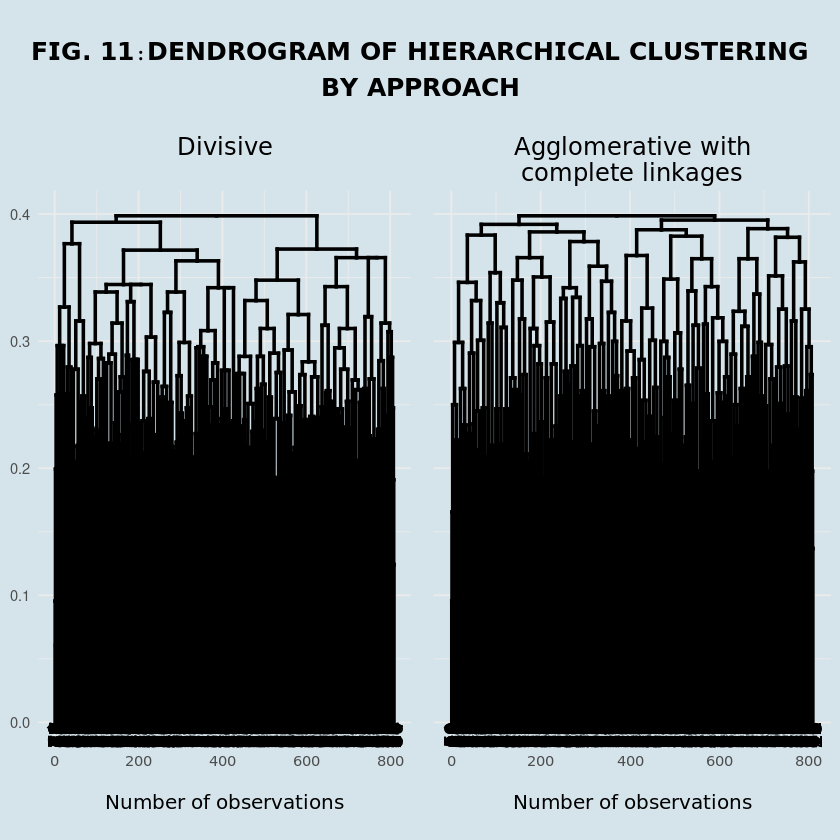

In [27]:
# Define the packages to be installed
packages2 <- c(
  "mvtnorm", "fpc", "mclust", "factoextra", "cluster", 
  "cowplot", "ggdendro", "dendextend", "reshape2", "gridExtra", "grid"
)

# Install and load necessary packages
invisible(lapply(packages2, install_if_missing))

# Compute the dissimilarity matrix
gower_dist <- daisy(new_data, metric = c("gower"))

# Perform divisive hierarchical clustering
divisive_clust <- diana(as.matrix(gower_dist), diss = TRUE, keep.diss = TRUE)

# Perform agglomerative hierarchical clustering with complete linkages
aggl_clust_comp <- hclust(gower_dist, method = "complete")

# Data for dendrogram plots
divisive_dendro_data <- as.dendrogram(divisive_clust)
aggl_dendro_data <- as.dendrogram(aggl_clust_comp)

# Create a list of dendrograms
dend_list <- dendlist(divisive_dendro_data, aggl_dendro_data)

# Convert dendrograms to ggplot objects
ggd1 <- as.ggdend(dend_list[[1]])
ggd2 <- as.ggdend(dend_list[[2]])

# Create a ggplot for the divisive dendrogram
p1 <- ggplot(ggd1) +
  theme_minimal() +
  labs(x = "\nNumber of observations\n", y = NULL, title = "\nDivisive\n") +
  theme(
    plot.title = element_text(hjust = 0.5, family = "ITC Officina Sans", size = 14.5),
    axis.title.x = element_text(family = "ITC Officina Sans", size = 12),
    axis.title.y = element_text(family = "ITC Officina Sans", size = 12),
    axis.text.x = element_text(family = "ITC Officina Sans"),
    plot.background = element_rect(fill = "#D5E4EB", color = NA)
  )

# Create a ggplot for the agglomerative dendrogram
p2 <- ggplot(ggd2) + 
  theme_minimal() +
  labs(x = "\nNumber of observations\n", y = NULL, title = "\nAgglomerative with\ncomplete linkages") +
  theme(
    plot.title = element_text(hjust = 0.5, family = "ITC Officina Sans", size = 14.5),
    axis.title.x = element_text(family = "ITC Officina Sans", size = 12),
    axis.title.y = element_text(family = "ITC Officina Sans", size = 12),
    axis.text.y = element_blank(),
    axis.text = element_text(family = "ITC Officina Sans"),
    plot.background = element_rect(fill = "#D5E4EB", color = NA)
  )

# Combine plots
p12 <- arrangeGrob(
  p1, p2, nrow = 1, 
  top = grid::textGrob(
    "\n𝗙𝗜𝗚. 𝟭𝟭﹕𝗗𝗘𝗡𝗗𝗥𝗢𝗚𝗥𝗔𝗠 𝗢𝗙 𝗛𝗜𝗘𝗥𝗔𝗥𝗖𝗛𝗜𝗖𝗔𝗟 𝗖𝗟𝗨𝗦𝗧𝗘𝗥𝗜𝗡𝗚\n𝗕𝗬 𝗔𝗣𝗣𝗥𝗢𝗔𝗖𝗛", 
    gp = grid::gpar(fontsize = 15, fontfamily = "ITC Officina Sans", fontface = "bold")
  ), 
  padding = unit(0.5, "line")
)

# Add background color to the title and draw the combined plot
grid.newpage()
grid.rect(gp = gpar(fill = "#D5E4EB", col = NA))
grid.draw(p12)

![dendrograms](images/dendrograms.png)

**3.1.1 Number of Clusters**

The dendrogram generated through hierarchical clustering highlights the presence of two main branches. To supplement this analysis, methods such as the Elbow Plot and Silhouette Analysis are also employed to determine the optimal number of clusters.

In [28]:
# Data for scree plot using elbow method
max <- 10
clus_plot_data <- data.frame(t(cstats.table(gower_dist, aggl_clust_comp, max))) %>%
  rename(
    `Cluster number` = cluster.number,
    `Within sum of squares (WSS)` = within.cluster.ss,
    `Average silhouette width` = avg.silwidth
  )

# Elbow Method
elbow_plot <- ggplot(data = clus_plot_data, 
                     aes(x = `Cluster number`, y = `Within sum of squares (WSS)`)) + 
  geom_point() +
  geom_line() +
  # geom_vline(xintercept = 4, linetype="dotted", color = "red", linewidth=0.5) +
  ggtitle("") +
  theme(
    plot.title = element_text(hjust = 0.5, family = "ITC Officina Sans"),
    axis.title.x = element_text(family = "ITC Officina Sans", size = 13.5),
    axis.title.y = element_text(family = "ITC Officina Sans", size = 13.5),
    axis.text = element_text(family = "ITC Officina Sans")
  )

# Convert ggplot to plotly
elbow_plotly <- ggplotly(elbow_plot) %>%
  layout(
    hoverlabel = list(font = list(family = "ITC Officina Sans", size = 15)),
    plot_bgcolor = "#D5E4EB",
    paper_bgcolor = "#D5E4EB",
    title = list(
      text = "𝗙𝗜𝗚. 𝟭𝟭﹕𝗣𝗟𝗢𝗧 𝗢𝗙 𝗧𝗛𝗘 𝗢𝗣𝗧𝗜𝗠𝗔𝗟 𝗡𝗨𝗠𝗕𝗘𝗥 𝗢𝗙 𝗖𝗟𝗨𝗦𝗧𝗘𝗥𝗦 𝗨𝗦𝗜𝗡𝗚 𝗘𝗟𝗕𝗢𝗪 𝗠𝗘𝗧𝗛𝗢𝗗", 
      font = list(family = "ITC Officina Sans", size = 18), 
      y = 0.93
    ),
    margin = list(t = 75)
  )

# Silhouette Method
sil_plot <- ggplot(data = clus_plot_data, 
                   aes(x = `Cluster number`, y = `Average silhouette width`)) + 
  geom_point() +
  geom_line() +
  # geom_vline(xintercept = 4, linetype="dotted", color = "red", linewidth=0.5) +
  ggtitle("") +
  theme(
    plot.title = element_text(hjust = 0.5, family = "ITC Officina Sans"),
    axis.title.x = element_text(family = "ITC Officina Sans", size = 13.5),
    axis.title.y = element_text(family = "ITC Officina Sans", size = 13.5),
    axis.text = element_text(family = "ITC Officina Sans")
  )

# Convert ggplot to plotly
sil_plotly <- ggplotly(sil_plot) %>%
  layout(
    hoverlabel = list(font = list(family = "ITC Officina Sans", size = 15)),
    plot_bgcolor = "#D5E4EB",
    paper_bgcolor = "#D5E4EB",
    title = list(
      text = "𝗙𝗜𝗚. 𝟭𝟮﹕𝗣𝗟𝗢𝗧 𝗢𝗙 𝗧𝗛𝗘 𝗢𝗣𝗧𝗜𝗠𝗔𝗟 𝗡𝗨𝗠𝗕𝗘𝗥 𝗢𝗙 𝗖𝗟𝗨𝗦𝗧𝗘𝗥𝗦 𝗨𝗦𝗜𝗡𝗚 𝗘𝗟𝗕𝗢𝗪 𝗔𝗡𝗗 𝗦𝗜𝗟𝗛𝗢𝗨𝗘𝗧𝗧𝗘 𝗠𝗘𝗧𝗛𝗢𝗗𝗦", 
      font = list(family = "ITC Officina Sans", size = 18), 
      y = 0.93
    ),
    margin = list(t = 75)
  )

# Combine the plots
combined_plotly <- subplot(
  elbow_plotly, 
  sil_plotly, 
  nrows = 1, 
  titleX = TRUE, 
  titleY = TRUE, 
  margin = 0.04
)

combined_plotly

HTML widgets cannot be represented in plain text (need html)

**Elbow Plot:** This method, which analyzes the rate of decrease in the within-cluster sum of squares (WSS), identifies two clusters as the "elbow point." At this point, the rate of decrease significantly slows, suggesting that two clusters best capture the structure of the data.

**Silhouette Analysis:**
- The silhouette width, which measures the quality of clustering, drops significantly after 2 clusters.
- It remains relatively constant between 3 and 4 clusters and gradually approaches near zero at 6 clusters, remaining stable beyond this point.
- The highest average silhouette width occurs at 2 clusters; this is considered the optimal number for further analysis.
<br><br>

**3.1.2. Clusters Visualization**

The graph below provides a clearer representation of the formation of two distinct clusters, each highlighted by a specific color.

In [29]:
# Cut the dendrogram to form clusters
k <- 2  # Choose the number of clusters
clusters <- cutree(as.hclust(aggl_clust_comp), k = 2)

# Make a data copy
new_data1 <- new_data

# Add cluster assignments to the original data
new_data1$Cluster <- as.factor(clusters)

# Dendrogram data for Agglomerative clustering
dendro_col <- as.dendrogram(aggl_clust_comp) %>%
  set("branches_k_color", k = 2, value = c("#01877C", "#005289")) %>%
  set("branches_lwd", 0.6) %>%
  set("labels_colors", value = c("darkslategray")) %>%
  set("labels_cex", 0.2)

# Dendrogram by color
dendrogram <- ggplot(as.ggdend(dendro_col), theme = theme_minimal()) +
  labs(
    x = "Number of observations", 
    y = "Height", 
    title = "\n𝗙𝗜𝗚. 𝟭𝟯﹕ 𝗗𝗘𝗡𝗗𝗥𝗢𝗚𝗥𝗔𝗠 𝗢𝗙 𝗧𝗛𝗘 𝗧𝗪𝗢 𝗖𝗟𝗨𝗦𝗧𝗘𝗥𝗦"
  ) +
  theme(
    plot.title = element_text(hjust = 0.5, family = "ITC Officina Sans", size = 15),
    axis.title.x = element_blank(),
    axis.title.y = element_blank(),
    axis.text.x = element_blank(),
    axis.text.y = element_blank(),
    axis.ticks = element_blank(),
    plot.background = element_rect(fill = "#D5E4EB", color = NA)
  )

# Radial graph
radial_graph <- ggplot(as.ggdend(dendro_col), labels = TRUE) + 
  labs(title = "\n𝗙𝗜𝗚. 𝟭𝟯﹕ 𝗥𝗔𝗗𝗜𝗔𝗟 𝗚𝗥𝗔𝗣𝗛 𝗢𝗙 𝗧𝗛𝗘 𝗧𝗪𝗢 𝗖𝗟𝗨𝗦𝗧𝗘𝗥𝗦") +
  scale_y_reverse(expand = c(0.2, 0)) +
  coord_polar(theta = "x") +
  theme(
    plot.title = element_text(hjust = 0.5, family = "ITC Officina Sans", size = 15),
    axis.title.x = element_blank(),
    axis.title.y = element_blank(),
    axis.text.x = element_blank(),
    axis.text.y = element_blank(),
    axis.ticks = element_blank(),
    plot.background = element_rect(fill = "#D5E4EB", color = NA)
  )

# radial_graph
# ggsave("radial_graph.png", plot = radial_graph, width = 10, height = 10, dpi = 300)

![radial_graph](images/radial_graph.png)

Alternatively, the heatmap in Figure 14 visually represents relationships between the two identified clusters and various categorical features associated with hair loss. The intensity of the color gradient, ranging from white to dark orange, reflects the percentage of individuals with hair loss for each specific feature.

In [30]:
# Reshape data with cluster numbers to long format
clust_long <- reshape2::melt(new_data1, 
                             id.vars = c("Cluster", "Age", "HairLoss", "Stress"),
                             variable.name = "Variable", 
                             value.name = "Value")

# Calculate counts and percentages for heatmap
clust_long_summ <- clust_long %>%
  group_by(Cluster, Variable, Value, HairLoss) %>%
  summarise(Count = n(), .groups = "drop") %>%
  group_by(Cluster, Variable, Value) %>%
  mutate(Percentage = Count / sum(Count)) %>%
  ungroup() %>%
  filter(Value == "1", HairLoss == "withBaldness")

# Create heatmap
clus_heatmap <- plot_ly(
  data = clust_long_summ,
  x = ~Cluster,
  y = ~Variable,
  z = ~Percentage,
  type = "heatmap",
  colors = colorRamp(c("white", "#FF6347")),
  text = ~paste("<b>Cluster:</b>", Cluster, "<br><b>Feature:</b>", Variable, "<br><b>Percentage of individuals with feature and baldness:</b>", label_percent(accuracy = 0.01)(round(Percentage, 4))),
  hoverinfo = "text"
) %>%
  layout(
    title = "Heatmap of Cluster vs Feature",
    xaxis = list(
      title = "Cluster", 
      titlefont = list(family = "ITC Officina Sans", size = 18), 
      tickfont = list(family = "ITC Officina Sans")
    ),
    yaxis = list(
      title = "Feature", 
      titlefont = list(family = "ITC Officina Sans", size = 18), 
      tickfont = list(family = "ITC Officina Sans", size = 10), 
      showticklabels = TRUE
    )
  ) %>%
  layout(
    title = list(
      text = "\n𝗙𝗜𝗚. 𝟭𝟰﹕𝗛𝗘𝗔𝗧𝗠𝗔𝗣 𝗢𝗙 𝗖𝗟𝗨𝗦𝗧𝗘𝗥 𝗩𝗦 𝗙𝗘𝗔𝗧𝗨𝗥𝗘",
      font = list(size = 18)
    ),
    paper_bgcolor = "#D5E4EB",
    margin = list(l = 30, r = 30, b = 25, t = 70)
  ) %>%
  style(
    hoverlabel = list(
      font = list(
        family = "ITC Officina Sans",
        size = 15
      )
    )
  )

clus_heatmap

HTML widgets cannot be represented in plain text (need html)

- Both clusters exhibit similar patterns for features associated with medical conditions, including scalp infection, psoriasis, and androgenetic alopecia, as well as hormonal changes and medications and treatments such as immunomodulators.

- A notable difference emerges in the feature related to selenium deficiency, with Cluster 2 showing a significantly higher percentage compared to Cluster 1.

- Overall, Cluster 2 shows higher percentages of individuals with both a specific feature and baldness compared to Cluster 1. This suggests stronger feature-related associations with hair loss in Cluster 2.
<br><br>

### 3.3. Importance Analysis

Importance measures are examined to determine which features contribute most significantly to the model's performance, thereby identifying the key predictors of hair loss.

**3.3.1. Mean Decrease (MD) Measures**

Figure 15 visualizes the importance of various features in the model by showing how much the accuracy decreases when each feature is removed (Absolute Mean Decrease Accuracy).

In [31]:
# Extract features importances
rf_importance <- as.data.frame(importance(rf_model$finalModel))[, 3:4] %>%
  rownames_to_column("Feature") %>%
  filter(MeanDecreaseAccuracy > 0) %>%
  mutate(Feature = gsub("1$", "", Feature))

# Create a bar plot by MDA
importance_plot_mda <- plot_ly(
  slice(rf_importance %>% arrange(desc(MeanDecreaseAccuracy)), 1:20), # Top 20 features
  x = ~abs(MeanDecreaseAccuracy), 
  y = ~reorder(Feature, abs(MeanDecreaseAccuracy)), 
  type = "bar", 
  orientation = "h",
  marker = list(color = "#005289")
) %>%
  layout(
    xaxis = list(
      title = "Absolute Mean Decrease Accuracy",
      tickfont = list(family = "ITC Officina Sans", size = 13.5),
      titlefont = list(family = "ITC Officina Sans", size = 16.5)
    ),
    yaxis = list(
      title = "Feature", 
      showticklabels = TRUE,
      tickfont = list(family = "ITC Officina Sans", size = 12),
      titlefont = list(family = "ITC Officina Sans", size = 16.5)
    ),
    paper_bgcolor = "#D5E4EB",
    plot_bgcolor = "#D5E4EB",
    margin = list(l = 30, r = 30, b = 25, t = 100)
  ) %>%
  style(
    hoverlabel = list(
      font = list(
        family = "ITC Officina Sans",
        size = 15
      )
    )
  ) %>%
  layout(
    title = list(
      text = "\n𝗙𝗜𝗚. 𝟭𝟱﹕𝗕𝗔𝗥 𝗚𝗥𝗔𝗣𝗛 𝗢𝗙 𝗙𝗘𝗔𝗧𝗨𝗥𝗘 𝗜𝗠𝗣𝗢𝗥𝗧𝗔𝗡𝗖𝗘 𝗕𝗬 𝗠𝗘𝗔𝗡 𝗗𝗘𝗖𝗥𝗘𝗔𝗦𝗘 𝗔𝗖𝗖𝗨𝗥𝗔𝗖𝗬",
      font = list(size = 18)
    ),
    paper_bgcolor = "#D5E4EB",
    plot_bgcolor = "#D5E4EB",
    margin = list(l = 30, r = 30, b = 25, t = 60)
  ) %>%
  style(
    hoverlabel = list(
      font = list(
        family = "ITC Officina Sans",
        size = 15
      )
    )
  )

importance_plot_mda

HTML widgets cannot be represented in plain text (need html)

- Stress in its linear form (represented by Stress.L) emerges as the most influential feature, closely followed by age and smoking.
- Features related to medications and treatments (e.g., immunomodulators and Rogaine), nutritional deficiencies (e.g., zinc and protein deficiency), environmental factors, medical conditions (e.g., psoriasis and alopecia areata), and the quadratic form of stress also contribute substantially to the model's predictive capabilities.
<br><br>

On the other hand, Figure 16 presents the importance of various features in the dataset, measured by the Absolute Mean Decrease Gini. This metric shows how much the Gini impurity criterion decreases when a feature is included.

In [32]:
# Create a bar plot by MDG
importance_plot_mdg <- plot_ly(
  slice(rf_importance %>% arrange(desc(MeanDecreaseGini)), 1:20), # Top 20 features
  x = ~abs(MeanDecreaseGini), 
  y = ~reorder(Feature, abs(MeanDecreaseGini)), 
  type = "bar", 
  orientation = "h",
  marker = list(color = "#01877C")
) %>%
layout(
  xaxis = list(
    title = "Absolute Mean Decrease Gini",
    tickfont = list(family = "ITC Officina Sans", size = 13.5),
    titlefont = list(family = "ITC Officina Sans", size = 16.5)
  ),
  yaxis = list(
    title = "Feature", 
    showticklabels = TRUE,
    tickfont = list(family = "ITC Officina Sans", size = 12),
    titlefont = list(family = "ITC Officina Sans", size = 16.5)
  ),
  paper_bgcolor = "#D5E4EB",
  plot_bgcolor = "#D5E4EB",
  margin = list(l = 30, r = 30, b = 25, t = 100)
) %>%
style(
  hoverlabel = list(
    font = list(
      family = "ITC Officina Sans",
      size = 15
    )
  )
) %>%
layout(
  title = list(
    text = "\n𝗙𝗜𝗚. 𝟭𝟲﹕𝗕𝗔𝗥 𝗚𝗥𝗔𝗣𝗛 𝗢𝗙 𝗙𝗘𝗔𝗧𝗨𝗥𝗘 𝗜𝗠𝗣𝗢𝗥𝗧𝗔𝗡𝗖𝗘 𝗕𝗬 𝗠𝗘𝗔𝗡 𝗗𝗘𝗖𝗥𝗘𝗔𝗦𝗘 𝗚𝗜𝗡𝗜",
    font = list(size = 18)
  ),
  paper_bgcolor = "#D5E4EB",
  plot_bgcolor = "#D5E4EB",
  margin = list(l = 30, r = 30, b = 25, t = 60)
) %>%
style(
  hoverlabel = list(
    font = list(
      family = "ITC Officina Sans",
      size = 15
    )
  )
)

importance_plot_mdg

HTML widgets cannot be represented in plain text (need html)

- This time around, age emerges as the most influential feature, followed closely by the linear stress (Stress.L), underscoring their significant impact on the model's overall performance.
- Features associated with lifestyle factors (e.g., environmental factors, smoking, weight loss, and poor hair care habits) and medical history (e.g., genetics and hormonal changes) also play critical roles in shaping the model's predictive capabilities.
<br><br>

**3.3.2. Composite Importance**

To rank the features in terms of importance, both the Mean Decrease Accuracy (MDA) and Mean Decrease Gini (MDG) are integrated. The process involves the following steps:

1. **Initial Selection:** Features must have a nonzero MDA and MDG to be included in the ranking.
2. **Normalization:** Both MDA and MDG are normalized to ensure comparability across different scales. This normalized mean decrease measure is computed by:

$$ MD_{norm} = \frac{MD - MD_{min}}{MD_{max} - MD_{min}} $$


3. **Composite Importance (CI):** CI is calculated for each feature by averaging the normalized MDA and MDG.
<br><br>
 
Based on the results, the following features are the key predictors of hair loss:  

- **Age** emerges as the most influential predictor of hair loss, with the highest composite importance score (92.25). Its substantial Mean Decrease Accuracy (MDA) and Mean Decrease Gini (MDG) underscore its critical role in the model.<br><br>  
- **Stress**  
   - **Linear Component**: Stress (59.76) ranks as the second most important predictor, showing a stronger influence on the model compared to its quadratic component.  
   - **Quadratic Component**: The quadratic term (19.94) provides a smaller, though non-negligible, contribution, suggesting the presence of nonlinear effects in the stress-hair loss relationship.<br><br>  
- **Lifestyle Factors**  
   - **Smoking** (41.88) stands out as the most important lifestyle predictor.  
   - **Environmental Factors** (28.89) and **Weight Loss** (18.66) make moderate contributions to the model's performance.<br><br>  
- **Medical History**  
     - **Medications and Treatments**: **Immunomodulators** (30.67) and **Rogaine** (16.48) are notable treatments, with **Chemotherapy** (12.29) adding moderate strength. 
     - **Nutritional Deficiencies**: **Zinc Deficiency** (27.78) and **Protein Deficiency** (25.19) are the strongest predictors in this category, while **Magnesium Deficiency** (11.57) has a smaller, yet notable, influence.   
   - **Medical Conditions**: **Psoriasis** (21.50) and **Alopecia Areata** (16.43) are significant conditions associated with hair loss.  
   - **Hormonal Changes** (19.27) contribute moderately to the prediction model.

In [33]:
# Rank the features based on the Compostive Importance
rf_importance_ranked <- rf_importance %>%
  filter(MeanDecreaseAccuracy > 0) %>%
  mutate(across(where(is.numeric), \(x) round(x, digits = 4)),
         scaled_mda = ((MeanDecreaseAccuracy - min(MeanDecreaseAccuracy)) /
                       (max(MeanDecreaseAccuracy) - min(MeanDecreaseAccuracy))) * 100,
         scaled_mdg = ((MeanDecreaseGini - min(MeanDecreaseGini)) / 
                       (max(MeanDecreaseGini) - min(MeanDecreaseGini))) * 100,
         CI = (scaled_mda + scaled_mdg) / 2,
         comp_rank = rank(desc(CI))
  ) %>%
  arrange(desc(CI)) %>%
  select(Feature, comp_rank, CI, everything()) %>%
  mutate(across(where(is.numeric), \(x) round(x, digits = 2)))

# Tabularize the summarized metrics of the models
#summarize_variable(
#  slice(rf_importance_ranked[, c(1, 3:5)], 1:15), 
#  rownames = TRUE,
#  dom = "tip",
#  pageLength = 5
#)

## Select features through importance ranking
# Determine the threshold for feature selection
important_features_select <- rf_importance_ranked$Feature[rf_importance_ranked$CI > 10]

# Subset the data based on selected features
train_data_select <- train_data[, c("HairLoss", "Stress", setdiff(important_features_select, c("Stress.L", "Stress.Q")))]
test_data_select <- test_data[, c("HairLoss", "Stress", setdiff(important_features_select, c("Stress.L", "Stress.Q")))]

# Train the logistic regression model
set.seed(123)
logistic_model_select <- train(
  HairLoss ~ ., 
  data = train_data_select, 
  method = "glm", 
  family = "binomial", 
  trControl = train_control, 
  metric = "ROC",
  trace = FALSE
)

# Train the SVM model
set.seed(123)
svm_model_select <- train(
  HairLoss ~ .,
  data = train_data_select,
  method = "svmRadial",
  trControl = train_control,
  metric = "ROC",
  trace = FALSE
)

# Train the random forest model
set.seed(123)
rf_model_select <- train(
  HairLoss ~ ., 
  data = train_data_select, 
  method = "rf", 
  trControl = train_control, 
  metric = "ROC",
  trace = FALSE,
  importance = TRUE
)

# Evaluate models' performances
class_metrics_select <- rbind(
  evaluate_model(model = logistic_model_select, test = test_data_select, y = "HairLoss", model_name = "Logistic Regression"),
  evaluate_model(model = svm_model_select, test = test_data_select, y = "HairLoss", model_name = "SVM"),
  evaluate_model(model = rf_model_select, test = test_data_select, y = "HairLoss", model_name = "Random Forest")
)

# Tabularize the summarized metrics of the models
summarize_variable(
  class_metrics_select, 
  rownames = TRUE
)

Setting levels: control = withoutBaldness, case = withBaldness

Setting direction: controls > cases

Setting levels: control = withoutBaldness, case = withBaldness

Setting direction: controls < cases

Setting levels: control = withoutBaldness, case = withBaldness

Setting direction: controls < cases



HTML widgets cannot be represented in plain text (need html)

## 4. Conclusions

### 4.1. Objective 1

The average individual in the survey is characterized as most likely having:

- **An age of 34 years old**;  
- **One of the following medical conditions**: Alopecia Areata, psoriasis, thyroid problems, Androgenetic Alopecia, or dermatitis;  
- **Used one of these medications/treatments**: Rogaine, antidepressants, steroids, heart medication, or Accutane;  
- **A deficiency in one of these nutrients**: Zinc, Vitamin D, Biotin, Omega-3 fatty acids, or Vitamin A;  
- **Experienced a moderate level of stress**; and  
- **About a 1 in 2 chance of**:  
  - A family history of baldness;
  - Experiencing hormonal changes;
  - Practicing poor hair care habits;
  - Being exposed to environmental factors that may contribute to hair loss;
  - Being a smoker; and
  - Experiencing significant weight loss.  

### 4.2. Objective 2

Hair loss outcomes (baldness and its absence) among the surveyed individuals are described as follows:  

- **Their prevalences are nearly equal among**:  
  - All respondents;
  - Adults who are considered young (17–30 years) and middle-aged (31–45 years);
  - Across all stress levels; and 
  - Those who have and have not experienced hormonal changes.
- **Baldness is more prevalent among individuals with the following medical conditions**: Alopecia Areata, Androgenetic Alopecia, and Seborrheic Dermatitis.  
- **Individuals who have used steroids and antibiotics are more likely to experience baldness**.  
- **Magnesium deficiency is slightly more common among individuals with baldness**.  
- **Baldness is somewhat**:
  - More prevalent among those with a family history of baldness;
  - Less prevalent among individuals with poor hair care habits, exposure to environmental factors, and smoking. 
- **Baldness is more prevalent among those who have experienced significant weight loss**.  

However, due to the negligible individual relationships observed with these factors, **each factor alone is not a reliable predictor of hair loss outcomes**.  

### 4.3. Objective 3

The key predictors of hair loss can be categorized as:  

- **Age** is the most important predictor that influences hair loss outcomes.  
- **Stress**, particularly its linear component, plays a significant role, with its quadratic form highlighting potential nonlinear effects.  
- **Lifestyle factors**, such as smoking, environmental factors, and weight loss, are relevant predictors, with smoking ranking highest.  
- **Medical history**, encompassing conditions, medications and treatments, and nutritional deficiencies, also contributes to the proposed model’s predictive strength. 
<br><br>


## 5. References

Keita, Z. (2024, August 8). _Classification in Machine Learning: An Introduction_. DataCamp. Retrieved from https://www.datacamp.com/blog/classification-machine-learning

Khamis, Harry. (2008). _Measures of Association—How to Choose_. _Journal of Diagnostic Medical Sonography_, 24(3), 155–162. https://doi.org/10.1177/8756479308317006.

Mangiafico, S. (2024). _wilcoxonRG: Glass rank biserial correlation coefficient_. The Comprehensive R Archive Network (CRAN). Retrieved from
https://CRAN.R-project.org/package=rcompanion

Prajapati, Jignesh, Patel, Ankit, & Raninga, Punit. (2014). _Facial Age Group Classification_. _IOSR Journal of Electronics and Communication Engineering_, 9, 33–39. https://doi.org/10.9790/2834-09123339.

Reusova, A. (2018). _Hierarchical Clustering on Categorical Data in R_. Towards Data Science. Retrieved from https://towardsdatascience.com/hierarchical-clustering-on-categorical-data-in-r-a27e578f2995
<br><br>

## 6. Appendix

### 6.1. Tables
**6.1.1. Summary Statistics of the Surveyed Individuals by Factor**

In [34]:
# Tabularize summary statistics of Genetics
summarize_variable(
  data = data %>% rename(`Has a family history of baldness` = Genetics),
  variable = "Has a family history of baldness",
  rownames = FALSE
)

# Tabularize summary statistics of Hormonal Changes
summarize_variable(
  data %>% rename(`Has experienced hormonal changes` = `Hormonal Changes`),
  variable = "Has experienced hormonal changes",
  rownames = FALSE
)

# Tabularize summary statistics of Stress
summarize_variable(
  data %>% 
    mutate(
      Stress = factor(Stress, levels = c("High", "Moderate", "Low"), ordered = TRUE)
    ) %>%
    rename(`Stress level` = Stress),
  variable = "Stress level",
  rownames = FALSE
)

# Tabularize summary statistics of Poor Hair Care Habits
summarize_variable(
  data %>%
    rename(
      `Practices poor hair care habits` = `Poor Hair Care Habits`
    ),
  variable = "Practices poor hair care habits",
  rownames = FALSE
)

# Tabularize summary statistics of Environmental Factors
summarize_variable(
  data %>%
    rename(
      `Exposed to environmental factors that may contribute to hair loss` = `Environmental Factors`
    ),
  variable = "Exposed to environmental factors that may contribute to hair loss",
  rownames = FALSE
)

# Tabularize summary statistics of Smoking
summarize_variable(
  data,
  variable = "Smoking",
  rownames = FALSE
)

# Tabularize summary statistics of Weight Loss
summarize_variable(
  data %>%
    rename(
      `Has experienced significant weight loss` = `Weight Loss`
    ),
  variable = "Has experienced significant weight loss",
  rownames = FALSE
)

HTML widgets cannot be represented in plain text (need html)

HTML widgets cannot be represented in plain text (need html)

HTML widgets cannot be represented in plain text (need html)

HTML widgets cannot be represented in plain text (need html)

HTML widgets cannot be represented in plain text (need html)

HTML widgets cannot be represented in plain text (need html)

HTML widgets cannot be represented in plain text (need html)

**6.1.2. Summary Statistics of the Surveyed Individuals by Factor and Hair Loss Outcome**

In [35]:
# Tabularize summary statistics by Age Group and Hair Loss outcome
summarize_variable(
  age_table %>%
    mutate(`Age Group` = factor(`Age Group`, levels = c("Young (17-30)", "Middle-aged (31-45)", "Old (>45)"), ordered = TRUE)) %>%
    arrange(`Age Group`)
)

# Tabularize summary statistics by Stress and Hair Loss outcome
summarize_variable(
  stress_table %>%
    mutate(`Stress` = factor(`Stress`, levels = c("Low", "Moderate", "High"), ordered = TRUE)) %>%
    arrange(`Stress`) %>%
    rename(`Stress level` = Stress)
)

# Tabularize summary statistics by Medical Conditions and Hair Loss outcome
summarize_variable(
  medical_conditions_table, 
  dom = "tip", 
  pageLength = 5
)

# Tabularize summary statistics by Medications & Treatments and Hair Loss outcome
summarize_variable(
  medications_table, 
  dom = "tip", 
  pageLength = 5
)

# Tabularize summary statistics by Nutritional Deficiencies and Hair Loss outcome
summarize_variable(
  nutritional_deficiencies_table, 
  dom = "tip", 
  pageLength = 5
)

# Tabularize the summary statistics by Genetics and Hair Loss outcome
summarize_variable(genetics_table)

# Tabularize the summary statistics by Hormonal Changes and Hair Loss outcome
summarize_variable(hormonal_changes_table)

# Tabularize the summary statistics by Poor Hair Care Habits and Hair Loss outcome
summarize_variable(hair_care_table %>% arrange(desc(.[[1]])))

# Tabularize the summary statistics by Environmental Factors and Hair Loss outcome
summarize_variable(envi_factors_table %>% arrange(desc(.[[1]])))

# Tabularize the summary statistics by Smoking and Hair Loss outcome
summarize_variable(smoking_table %>% arrange(desc(.[[1]])))

# Tabularize the summary statistics by Weight Loss and Hair Loss outcome
summarize_variable(weight_loss_table %>% arrange(desc(.[[1]])))

HTML widgets cannot be represented in plain text (need html)

HTML widgets cannot be represented in plain text (need html)

HTML widgets cannot be represented in plain text (need html)

HTML widgets cannot be represented in plain text (need html)

HTML widgets cannot be represented in plain text (need html)

HTML widgets cannot be represented in plain text (need html)

HTML widgets cannot be represented in plain text (need html)

HTML widgets cannot be represented in plain text (need html)

HTML widgets cannot be represented in plain text (need html)

HTML widgets cannot be represented in plain text (need html)

HTML widgets cannot be represented in plain text (need html)

**6.1.3. Features Importance**

In [36]:
# Tabularize feature importances
summarize_variable(
	rf_importance_ranked[, c(1,3:5)],
	dom = "tip",
	pageLength = 5
)

HTML widgets cannot be represented in plain text (need html)

### 6.2. Codes

In [37]:
# Load pre-installed, required packages
suppressPackageStartupMessages(library(tidyverse))
suppressPackageStartupMessages(library(dplyr))
suppressPackageStartupMessages(library(ggplot2))
suppressPackageStartupMessages(library(plotly))
suppressPackageStartupMessages(library(scales))
suppressPackageStartupMessages(library(readr))
suppressPackageStartupMessages(library(DT))

# Install and load the 'ggthemes' package
suppressWarnings(suppressMessages(install.packages("ggthemes", quite=TRUE)))
suppressPackageStartupMessages(library(ggthemes))

# Read the 'Predict Hair Fall' dataset
data <- read_csv("data/Predict Hair Fall.csv", show_col_types=FALSE)

# Encode data types and factors
data <- data %>%
	mutate(Id = as.integer(Id),
		   Age = as.integer(Age),
		   across(where(is.character), as.factor),
		   Stress = factor(Stress, levels=c("Low", "Moderate", "High"), ordered=TRUE),
		   `Hair Loss` = as.factor(`Hair Loss`)
		   )

# Backup original dataset
data1 <- read_csv("data/Predict Hair Fall.csv", show_col_types=FALSE)

# Function to install missing packages
install_if_missing <- function(p) {
  if (!require(p, character.only = TRUE)) {
    suppressWarnings(suppressMessages(install.packages(p, dependencies = TRUE)))
    suppressPackageStartupMessages(library(p, character.only = TRUE))
  }
}

# Function to tabularize summary statistics of a given variable in the dataset
summarize_variable <- function(data, variable=NULL, caption=NULL, dom="t", searching=FALSE, rownames=FALSE, pageLength=10) {
  if (is.null(variable)) {
    datatable(data, 
                  class="cell-border stripe", 
                  options = list(dom=dom, searching=searching, pageLength=pageLength),
                  rownames=rownames,
                  caption=if (!is.null(caption)) htmltools::tags$caption(
                    style = 'caption-side: top; text-align: center;',
                    caption
                  ) else NULL)
  } else {
	summarized_data <- data %>%
      filter(!!sym(variable) != "No Data") %>%
      group_by(!!sym(variable)) %>%
      summarise(Count = n(), .groups="drop") %>%
      {
        if (is.ordered(data[[variable]])) {
          arrange(., desc(!!sym(variable)))
        } else {
          arrange(., desc(Count))
        }
      } %>%
      mutate(Percentage = label_percent(accuracy=0.01)(Count/sum(Count)))
    
    datatable(summarized_data %>% rename(!!variable := !!sym(variable)),
                  class="cell-border stripe", 
                  options = list(dom=dom, searching=searching, pageLength=pageLength),
			      rownames=rownames,
                  caption=if (!is.null(caption)) htmltools::tags$caption(
                    style = 'caption-side: top; text-align: center;',
                    caption
                  ) else NULL)
  }
}
			  
# Function to check if a package is installed, and install it if not
install_if_missing <- function(package) {
  if (!require(package, character.only = TRUE)) {
    install.packages(package, dependencies = TRUE)
    library(package, character.only = TRUE)
  }
}
	
## ---------- FUNCTIONS ---------- ## 			  
# Function to create a propotional stack bar plot (used for subplots of multiple variables)
create_plotly_stackbar <- function(data = data, var, showlegend=FALSE, yaxis_text=NULL, yaxis_titleSize=11.5, yaxis_tickSize=10, tickangle=45) {
  yaxis_title <- ifelse(is.null(yaxis_text), var, yaxis_text)
  
  plot_data <- as.data.frame(table(data %>% filter(!!sym(var) != "No Data") %>%
								   		select(`Hair Loss`, all_of(var)))) %>%
    rename_with(~ gsub("\\.", " ", .)) %>%
	group_by(!!sym(var)) %>%
    mutate(Percentage = 100*Freq/sum(Freq),
           `Hair Loss` = ifelse(`Hair Loss` == 1, "With baldness", "Without baldness")
          ) %>%
    rename(Count = Freq)
  
  plot <- plot_ly(
    data = plot_data,
    x = ~Percentage,
    y = as.formula(paste0("~`", var, "`")),
    type = "bar",
    color = ~`Hair Loss`,
    colors = c("#FF6347", "#8c8c8c"),
    showlegend = showlegend,
    text = ~paste0("<b>Percentage:</b> ", label_percent(accuracy=0.01)(Percentage/100), "\n<b>Count:</b> ", Count),
    hoverinfo = "text"
  ) %>%
    layout(
      xaxis = list(title = list(text="Percentage (%)", font = list(family="ITC Officina Sans", size=18))),
      yaxis = list(title = list(text = paste("\n<b>", yaxis_title, "</b>"),
								font = list(family="ITC Officina Sans", size = yaxis_titleSize), 
								standoff=43),
                   tickfont = list(family="ITC Officina Sans", size = yaxis_tickSize), tickangle=tickangle
				  ),
      barmode="stack",
      legend = list(orientation="h", xanchor="center", x=0.438, y=1.11, traceorder="normal",
					font = list(family="ITC Officina Sans", size=15)),
	  font = list(size = 14),
	  hoverlabel = list(font = list(family="ITC Officina Sans", size=15))
    )
  
  return(plot)
}			  
			  
# Function to create a data frame for contingency table of a variable			  
create_contingency_data <- function(data, var) {
	
  # Select relevant columns and filter out "No Data" values
  selected_data <- data %>% 
    select(`Hair Loss`, all_of(var)) %>%
    filter(!!sym(var) != "No Data")
  
  # Create contingency table
  contingency_data <- data.frame(matrix(
    with(selected_data, table(selected_data[[var]], `Hair Loss`)),
    nrow = dim(with(selected_data, table(selected_data[[var]], `Hair Loss`)))[1], 
    dimnames = dimnames(with(selected_data, table(selected_data[[var]], `Hair Loss`)))
  ))
  
  return(contingency_data)
}
			  
# Function to create stack bar plot for a variable
create_stackbar_plot1 <- function(data, var, yaxis_title, yaxis_text=NULL, plot_title=NULL, tickangle=45) {
  stackbar_data <- data %>% filter(!!sym(var) != "No Data") %>%
    mutate(!!sym(var) := factor(!!sym(var),
								levels = rownames(create_contingency_data(data, var) %>% 
												  	mutate(X01 = X0+X1) %>% 
													arrange(X1, desc(rownames(.)))
												 )
    ))
  
  plot <- create_plotly_stackbar(data = stackbar_data, 
								 var = var, 
								 showlegend=TRUE,
								 yaxis_text = yaxis_text,
								 yaxis_titleSize=20,
								 yaxis_tickSize=15,
								 tickangle = tickangle)
  
  plot %>%
    layout(
      plot_bgcolor = "#D5E4EB",
      paper_bgcolor = "#D5E4EB",
      title = list(text = plot_title, 
                   font = list(family = "ITC Officina Sans", size = 18), 
                   y = 0.93),
      margin = list(t = 95),
      xaxis = list(tickfont = list(family = "ITC Officina Sans", size = 15))
    )
}			  

# Function to create a contingency table of a variable				  
create_contingency_table <- function(data, var, first_colname=var) {
  # Append the proportion to each value in the dataframe
  data <- as.data.frame(
    apply(data %>% arrange(desc(X1)), c(1, 2), function(x) {
      percentage <- label_percent(accuracy=0.01)(x / sum(data))
      sprintf("%d (%s)", x, percentage)
    })
  ) %>%
    rownames_to_column(var=first_colname) 
  
  # Rename rows and columns
  colnames(data) <- c(first_colname, "Without baldness", "With baldness")
  
  # Reorder columns
  data <- data[,c(first_colname, "With baldness", "Without baldness")]								
  
  return(data)
}
			  
# Function to compute Point-Biserial Correlation
compute_point_biserial <- function(data, x, y, conf=0.95) {
  # Ensure the x and y are in the data
  if (!(x %in% colnames(data)) | !(y %in% colnames(data))) {
    stop("The variable x or y not found in the data.")
  }
  
  # Ensure the y contains only the specified values
  unique_y <- unique(data[[y]])
  if (length(unique_y) != 2) {
    stop("The variable y is not binary.")
  }
  
  # Extract values for individuals with and without the binary outcome
  with_group <- data[[x]][data[[y]] == 1]
  without_group <- data[[x]][data[[y]] == 0]
  
  # Calculate means
  X1 <- mean(with_group)
  X0 <- mean(without_group)
  
  # Calculate standard deviation of the entire x data
  sn <- sd(data[[x]])
  
  # Calculate sample sizes
  n1 <- length(with_group)
  n0 <- length(without_group)
  n <- n1 + n0
  
  # Compute the point biserial correlation coefficient
  rpb <- (X1 - X0) / sn * sqrt((n1 * n0) / (n^2))
  
  # Compute confidence intervals using cor.test
  rpb_cortest <- cor.test(data[[x]], data[[y]], conf.level=conf)
  lower_ci <- rpb_cortest$conf.int[1]
  upper_ci <- rpb_cortest$conf.int[2]
  
  rpb_df <- data.frame(x=x, y=y, X1=X1, X0=X0, rpb=rpb, lower_ci=lower_ci, upper_ci=upper_ci
                      ) %>%
    mutate(across(where(is.numeric) & !where(is.integer), ~ ifelse(abs(.) >= 0.01, 
                                          label_number(accuracy = 0.01)(.), 
                                          label_scientific(digits = 3)(.)))
    ) %>%
    rename(`Correlation coefficient` = rpb) %>%
	mutate(!!paste0(conf * 100, "% CI") := paste0("[", lower_ci, ", ", upper_ci, "]"),
		   Method="Point-biserial") %>%
	select(-c("lower_ci", "upper_ci"))
  
  return(rpb_df)
}			

# Function to compute Rank-Biserial Correlation
compute_rank_biserial <- function(data, x, y, o=0, l=1, conf=0.95) {
  # Install and load the 'rcompanion' package if not already installed
  if (!requireNamespace("rcompanion", quietly = TRUE)) {
    suppressWarnings(suppressMessages(install.packages("rcompanion", quiet=TRUE)))
  }
  suppressPackageStartupMessages(library(rcompanion))
  
  # Ensure the x and y are in the data
  if (!(x %in% colnames(data)) | !(y %in% colnames(data))) {
    stop("The variable x or y not found in the data.")
  }
  
  # Ensure the y contains only the specified values
  unique_y <- unique(data[[y]])
  if (length(unique_y) != 2) {
    stop("The variable y is not binary.")
  }
    
  # Rank the predictor variable
  data$ranked_factor <- rank(data[[x]], ties.method = "average") 
  with_group <- data$ranked_factor[data[[y]] == 1]
  without_group <- data$ranked_factor[data[[y]] == 0]	
	
  # Calculate mean ranks for individuals with and without the binary outcome
  R1 <- mean(with_group)
  R0 <- mean(without_group)
 
  # Compute outputs using the wilcoxonRG function
  group <- factor(c(rep("With group", length(with_group)), rep("Without group", length(without_group))))	
  rrb_wilcoxonRG <- wilcoxonRG(x = c(with_group, without_group), g = group, ci=TRUE, conf=conf)
	
  # Extract coefficient and confidence intervals
  rrb <- rrb_wilcoxonRG[[1]]
  lower_ci <- rrb_wilcoxonRG[[2]]
  upper_ci <- rrb_wilcoxonRG[[3]]
  
  rrb_df <- data.frame(x=x, y=y, R1=R1, R0=R0, rrb=rrb, lower_ci=lower_ci, upper_ci=upper_ci
					  ) %>%
    mutate(across(where(is.numeric) & !where(is.integer), ~ ifelse(abs(.) >= 0.01, 
                                          label_number(accuracy = 0.01)(.), 
                                          label_scientific(digits = 3)(.)))
    ) %>%
    rename(`Correlation coefficient` = rrb) %>%
	mutate(!!paste0(conf * 100, "% CI") := paste0("[", lower_ci, ", ", upper_ci, "]"),
		   Method="Rank-biserial") %>%
	select(-c("lower_ci", "upper_ci")) 
  
  return(rrb_df)
}

# Function to compute Phi Coefficient
compute_phi <- function(data, x, y, o=0, l=1, u, t, conf=0.95) {
  # Install and load the 'statpsych' package if not already installed
  if (!requireNamespace("statpsych", quietly = TRUE)) {
    suppressWarnings(suppressMessages(install.packages("statpsych", quiet=TRUE)))
  }
  suppressPackageStartupMessages(library(statpsych))
  
  # Ensure the x and y are in the data
  if (!(x %in% colnames(data)) | !(y %in% colnames(data))) {
    stop("The variable x or y not found in the data.")
  }
  
  # Ensure the x and y contain only binary values
  unique_x <- unique(data[[x]])
  unique_y <- unique(data[[y]])
  if (length(unique_x) != 2 | length(unique_y) != 2) {
    stop("The variables x and y must be binary.")
  }
  
  # Create contingency table
  contingency_table <- table(data[[x]], data[[y]])
  
  # Convert o, l, u, t to character
  o <- as.character(o)
  l <- as.character(l)
  u <- as.character(u)
  t <- as.character(t)
  
  # Extract counts from the contingency table using provided levels
  a <- contingency_table[t, l]
  b <- contingency_table[t, o]
  c <- contingency_table[u, l]
  d <- contingency_table[u, o]
  
  # Compute outputs using the function ci.phi
  ci_phi <- ci.phi(alpha = 1-conf, d, c, b, a)
  
  # Compute confidence interval limits
  phi <- ci_phi[[1]]
  ci_lower <- ci_phi[[3]]
  ci_upper <- ci_phi[[4]]
  
  # Create a dataframe to return the results
  phi_df <- data.frame(x = x, y = y, counts=paste(a,b,c,d, sep=", "), phi = phi, 
                       ci = paste0("[", round(ci_lower, 2), ", ", round(ci_upper, 2), "]")) %>%
    mutate(across(where(is.numeric) & !where(is.integer), ~ ifelse(abs(.) > 0.01, 
                                                                  label_number(accuracy = 0.01)(.), 
                                                                  label_scientific(digits = 3)(.)))
    ) %>%
    rename(`a, b, c, d` = counts,
           `Phi coefficient` = phi,
		   !!paste0(conf * 100, "% CI") := ci)
  
  return(phi_df)
}		

# Function to compute Cramer's V
compute_cramersV <- function(data, x, y, conf=0.95) {
  # Ensure the x and y are in the data
  if (!(x %in% colnames(data)) | !(y %in% colnames(data))) {
    stop("The variable x or y not found in the data.")
  }
  
  # Create contingency table
  contingency_table <- table(data[[x]], data[[y]])
  
  # Compute chi-square statistic
  chi2 <- chisq.test(contingency_table, simulate.p.value = TRUE)$statistic
  
  # Get the number of rows and columns in the contingency table
  n <- sum(contingency_table)
  r <- nrow(contingency_table)
  c <- ncol(contingency_table)
  rc <- paste(r, c, sep=", ")	
  
  # Compute outputs using the cramerV function
  cramersV <- cramerV(contingency_table, ci=TRUE, conf=conf)
  
  # Extract coefficient and confidence intervals
  cramers_v <- cramersV[[1]]
  lower_ci <- cramersV[[2]]
  upper_ci <- cramersV[[3]]
  
  # Create a dataframe to return the results
  cramers_v_df <- data.frame(
    n = n, 
    rc = rc, 
    x = x, 
    y = y, 
    chi2 = chi2, 
    cramers_v = cramers_v, 
    lower_ci = lower_ci, 
    upper_ci = upper_ci
  ) %>%
    mutate(across(
      where(is.numeric) & !where(is.integer), 
      ~ ifelse(abs(.) > 0.01, label_number(accuracy = 0.01)(.), label_scientific(digits = 3)(.))
    )) %>%
    rename(
      `Chi-square statistic` = chi2,
      `r, c` = rc,
      `Cramer's V` = cramers_v
    ) %>%
    mutate(!!paste0(conf * 100, "% CI") := paste0("[", lower_ci, ", ", upper_ci, "]")) %>%
    select(-c("lower_ci", "upper_ci"))
  
  rownames(cramers_v_df) <- c(1:nrow(cramers_v_df))
  
  return(cramers_v_df)
}
			
# Function for evaluating model performance
evaluate_model <- function(model, test, y, model_name) {
  
  # Check if pROC package is installed, if not, install it
  if (!requireNamespace("pROC", quietly = TRUE)) {
    install.packages("pROC")
  }
  suppressPackageStartupMessages(library(pROC))
  
  # Perform predictions using the model and test data
  prob <- predict(model, test, type = "prob")[, 2]
  predicted <- predict(model, test)
  
  # Create a confusion matrix to evaluate the model's performance
  conf_matrix <- confusionMatrix(predicted, test[[y]])
  
  # Compute model metrics
  roc <- roc(test[[y]], prob)
  auc <- auc(roc)
  accuracy <- conf_matrix$overall['Accuracy']
  precision <- conf_matrix$byClass['Pos Pred Value']
  recall <- conf_matrix$byClass['Sensitivity']
  f1 <- 2 * (precision * recall) / (precision + recall)
  
  # Return performance metrics as a dataframe
  results <- data.frame(
    AUC = round(auc, 4),
    Accuracy = round(accuracy, 4),
    Precision = round(precision, 4),
    Recall = round(recall, 4),
    f1 = round(f1, 4)
  ) %>%
  rename(`F1 Score` = f1)
  
  rownames(results) <- model_name
  
  return(results)
}			  
			  		  
# Function for cluster statistics
cstats.table <- function(dist, tree, k) {
clust.assess <- c("cluster.number","n","within.cluster.ss","average.within","average.between",
                  "wb.ratio","dunn2","avg.silwidth")
clust.size <- c("cluster.size")
stats.names <- c()
row.clust <- c()
output.stats <- matrix(ncol = k, nrow = length(clust.assess))
cluster.sizes <- matrix(ncol = k, nrow = k)
for(i in c(1:k)){
  row.clust[i] <- paste("Cluster-", i, " size")
}
for(i in c(2:k)){
  stats.names[i] <- paste("Test", i-1)
  
  for(j in seq_along(clust.assess)){
    output.stats[j, i] <- unlist(cluster.stats(d = dist, clustering = cutree(tree, k = i))[clust.assess])[j]
    
  }
  
  for(d in 1:k) {
    cluster.sizes[d, i] <- unlist(cluster.stats(d = dist, clustering = cutree(tree, k = i))[clust.size])[d]
    dim(cluster.sizes[d, i]) <- c(length(cluster.sizes[i]), 1)
    cluster.sizes[d, i]
    
  }
}
output.stats.df <- data.frame(output.stats)
cluster.sizes <- data.frame(cluster.sizes)
cluster.sizes[is.na(cluster.sizes)] <- 0
rows.all <- c(clust.assess, row.clust)
output <- rbind(output.stats.df, cluster.sizes)[ ,-1]
colnames(output) <- stats.names[2:k]
rownames(output) <- rows.all
is.num <- sapply(output, is.numeric)
output[is.num] <- lapply(output[is.num], round, 2)
output
}			  		  
			  		  
# Tabularize first five rows of the dataset			  
#summarize_variable(slice(data, 1:5), dom="t")

			  
## ------------------------------------------ ##
## ---------- DESCRIPTIVE ANALYSIS ---------- ##
## ------------------------------------------ ##
			  

## ---------- Age ---------- ##
			  
# Install and load the 'moments' package for calculating skewness
suppressWarnings(suppressMessages(install.packages("moments", quiet=TRUE)))
suppressPackageStartupMessages(library(moments))

# Summary statistics of the age
age_stats <- data.frame(Value = unclass(summary(data$Age))) %>%
  bind_rows(data.frame(Value = c(sd(data$Age), skewness(data$Age)), row.names = c("Std. Dev.", "Sk\u209a"))) %>%
  mutate_if(is.numeric, round, 2)

# Age distribution plot
age_dist_plot <- ggplot(data, aes(x = Age, text = paste0("<b>Count:</b> ", after_stat(count)))) +
  geom_histogram(breaks = hist(data$Age, breaks="FD", plot = FALSE)$breaks) +
  geom_vline(aes(xintercept = mean(Age)), col="#FFA53E", linewidth=0.5) +
  geom_vline(aes(xintercept = median(Age)), col="#4C6DB4", linewidth=0.5) +
  theme_economist() + 
  scale_color_economist() +
  scale_x_continuous(breaks = seq(15, 50, by=5)) +
  ggtitle("FIG. 1﹕HISTOGRAM OF THE AGE DISTRIBUTION OF SURVEYED INDIVIDUALS") +
  theme(
    plot.title = element_text(size=13, hjust=0.5),
    axis.title.x = element_text(family="ITC Officina Sans", size=13),
    axis.title.y = element_text(family="ITC Officina Sans", size=13)
  ) +
  labs(y="Count")

# Convert ggplot to plotly
age_dist_plotly <- ggplotly(age_dist_plot, tooltip=c("text")) %>%
  layout(
    hoverlabel = list(font = list(family="ITC Officina Sans", size=15)),
    xaxis = list(tickfont = list(family="ITC Officina Sans", size=13)),
    yaxis = list(tickfont = list(family="ITC Officina Sans", size=13))
  ) %>%
  add_annotations(
    text = paste0(
      "<b>Mean: </b>", round(mean(data$Age), 2), 
      ";  <b>Median: </b>", round(median(data$Age), 2), 
      ";  <b>Std. Deviation (<i>\u03c3</i>): </b>", round(sd(data$Age), 2), 
      ";  <b>Skewness (<i>Sk\u209a</i>): </b>", round(skewness(data$Age), 2)
    ),
    x = 0.04, y = 1.03, xref = "paper", yref = "paper",
    showarrow = FALSE, font = list(family="ITC Officina Sans", size=15), align="left"
  )			  
			  
#age_dist_plotly

## ---------- Medical History ---------- ##
			  
# Tabularize summary statistics of Genetics
#summarize_variable(
#  data = data %>% rename(`Has a family history of baldness` = Genetics),
#  variable = "Has a family history of baldness",
#  rownames = FALSE
#)			  

# Tabularize summary statistics of Hormonal Changes
#summarize_variable(
#  data %>% rename(`Has experienced hormonal changes` = `Hormonal Changes`),
#  variable = "Has experienced hormonal changes",
#  rownames = FALSE
#)	
			  
# Tabularize summary statistics of Medical Conditions
#summarize_variable(
#  data = data %>% rename(`Medical condition that may lead to baldness` = `Medical #Conditions`),
#  variable = "Medical condition that may lead to baldness",
#  dom = "tip",
#  pageLength = 5
#)
			  
# Tabularize summary statistics of Medications & Treatments
#summarize_variable(
#  data = data %>% rename(`Medication or treatment that may cause hair loss` = `Medications & #Treatments`),
#  variable = "Medication or treatment that may cause hair loss",
#  dom = "tip",
#  pageLength = 5
#)
			  
# Tabularize summary statistics of Nutritional Deficiencies
#summarize_variable(
#  data %>% rename(`Nutritional deficiency that may contribute to hair loss` = `Nutritional Deficiencies`),
#  variable = "Nutritional deficiency that may contribute to hair loss",
#  dom = "tip",
#  pageLength = 5
#)

## ---------- Stress ---------- ##
			  
# Tabularize summary statistics of Stress
#summarize_variable(
#  data %>% 
#    mutate(
#      Stress = factor(Stress, levels = c("High", "Moderate", "Low"), ordered = TRUE)
#    ) %>%
#    rename(`Stress level` = Stress),
#  variable = "Stress level",
#  rownames = FALSE
#)

## ---------- Lifestyle ---------- ##
		  
# Tabularize summary statistics of Poor Hair Care Habits
#summarize_variable(
#  data %>%
#    rename(
#      `Practices poor hair care habits` = `Poor Hair Care Habits`
#    ),
#  variable = "Practices poor hair care habits",
#  rownames = FALSE
#)
			  
# Tabularize summary statistics of Environmental Factors
#summarize_variable(
#  data %>%
#    rename(
#      `Exposed to environmental factors that may contribute to hair loss` = `Environmental #Factors`
#    ),
#  variable = "Exposed to environmental factors that may contribute to hair loss",
#  rownames = FALSE
#)
			  
# Tabularize summary statistics of Smoking
#summarize_variable(
#  data,
#  variable = "Smoking",
#  rownames = FALSE
#)
			  
# Tabularize summary statistics of Weight Loss
#summarize_variable(
#  data %>%
#    rename(
#      `Has experienced significant weight loss` = `Weight Loss`
#    ),
#  variable = "Has experienced significant weight loss",
#  rownames = FALSE
#)	
					  
# Tabularize summary statistics of Hair Loss
#summarize_variable(
#  data %>%
#    mutate(
#      `Hair Loss` = ifelse(`Hair Loss` == 1, "Yes", "No"),
#      `Hair Loss` = factor(`Hair Loss`, levels = c("No", "Yes"), ordered = TRUE)
#    ) %>%
#    rename(`With baldness` = `Hair Loss`),
#  variable = "With baldness",
#  rownames = FALSE
#)

			  
## ------------------------------------------- ##
## --------- MEASURES OF ASSOCIATION --------- ## 
## ------------------------------------------- ##

			  
## ---------- Biserial Correlations ---------- ##
			  
# Data frame for the pie graph, by Hair Loss
hair_loss <- data %>%
  select(`Hair Loss`) %>%
  group_by(`Hair Loss`) %>%
  summarise(Count = n(), .groups="drop") %>% 
  mutate(Proportion = Count/sum(Count)) %>%
  arrange(desc(`Hair Loss`), desc(Count))

# Factorize the Hair Loss variable
hair_loss$`Hair Loss` <- factor(hair_loss$`Hair Loss`, levels=c(0, 1))

# Create a pie graph for hair loss experience
hair_loss_pie <- plot_ly(
  type="pie",
  labels=paste0("<b>",ifelse(hair_loss$`Hair Loss` == 1, "With baldness", "Without baldness"),"</b>"),
  values = hair_loss$Count,
  textinfo="label",
  textposition="inside",
  hoverinfo="text",
  hovertext = paste0(
    "<b>Count:</b> ", hair_loss$Count,
    "<b>\nPercentage:</b> ", label_percent(accuracy=0.01)(hair_loss$Proportion)
  ),
  marker = list(
    colors = case_when(
      hair_loss$`Hair Loss`==1 ~ "#FF6347",
      hair_loss$`Hair Loss`==0 ~ "#8c8c8c"
    )
  ),
  textfont = list(
    family="ITC Officina Sans",
    size=18,
    color="white"
  )
) %>%
  layout(
    title = list(
      text="𝗙𝗜𝗚. 𝟮﹕𝗣𝗜𝗘 𝗚𝗥𝗔𝗣𝗛 𝗢𝗙 𝗧𝗛𝗘 𝗦𝗨𝗥𝗩𝗘𝗬𝗘𝗗 𝗜𝗡𝗗𝗜𝗩𝗨𝗔𝗟𝗦\n𝗕𝗬 𝗛𝗔𝗜𝗥 𝗟𝗢𝗦𝗦 𝗢𝗨𝗧𝗖𝗢𝗠𝗘",
      font = list(size=18)
    ),
    paper_bgcolor="#D5E4EB",
    margin = list(l=0, r=0, b=20, t=80),  # Increased top margin to add space between title and plot
    showlegend = FALSE  # Hide the legend
  ) %>%
  style(
    hoverlabel = list(
      font = list(
        family="ITC Officina Sans",
        size=15
      )
    )
  )

#hair_loss_pie	

# Create dataframe for Age Group
age_data <- data %>%
  select(Age, `Hair Loss`) %>%
  mutate(
    `Age Group` = case_when(
      Age >= 17 & Age <= 30 ~ "Young (17-30)",
      Age >= 31 & Age <= 45 ~ "Middle-aged (31-45)",
      Age > 45 ~ "Old (>45)",
      TRUE ~ NA_character_
    ),
    `Age Group` = factor(`Age Group`, levels = c("Young (17-30)", "Middle-aged (31-45)", "Old (>45)"), ordered = TRUE)
  )

# Create contingency table by Age Group and Hair Loss outcome
age_table <- create_contingency_table(create_contingency_data(age_data, "Age Group"), "Age Group")

# Tabularize summary statistics by Age Group and Hair Loss outcome
#summarize_variable(
#  age_table %>%
#    mutate(`Age Group` = factor(`Age Group`, levels = c("Young (17-30)", "Middle-aged (31-#45)", "Old (>45)"), ordered = TRUE)) %>%
#    arrange(`Age Group`)
#)		
					  
# Create a boxplot by Age Group and Hair Loss outcome
age_hair_loss_boxplot <- plot_ly(
  data = age_data,
  x = ~factor(`Hair Loss`, labels = c("Without Baldness", "With Baldness")),
  y = ~Age,
  type = "box",
  boxpoints = "outliers", # Show only outliers
  jitter = 0.3, # Add some jitter to the points
  color = ~factor(`Hair Loss`, labels = c("Without Baldness", "With Baldness")), # Add color by Hair Loss
  colors = c('#8c8c8c', '#FF6347') # Define colors
) %>%
  layout(
    title = list(
      text = "\n𝗙𝗜𝗚. 𝟯﹕𝗕𝗢𝗫𝗣𝗟𝗢𝗧 𝗢𝗙 𝗧𝗛𝗘 𝗔𝗚𝗘 𝗗𝗜𝗦𝗧𝗥𝗜𝗕𝗨𝗧𝗜𝗢𝗡 𝗕𝗬 𝗛𝗔𝗜𝗥 𝗟𝗢𝗦𝗦 𝗢𝗨𝗧𝗖𝗢𝗠𝗘",
      font = list(size = 18),
      x = 0.5,
      xanchor = "center",
      y = 0.95,
      yanchor = "top"
    ),
    margin = list(t = 100), # Add margin between title and plot
    xaxis = list(
      title = "Hair Loss Outcome",
      tickfont = list(family = "ITC Officina Sans"),
      titlefont = list(family = "ITC Officina Sans", size = 18),
      showticklabels = FALSE # Do not show x ticks texts
    ),
    yaxis = list(
      title = "Age",
      tickfont = list(family = "ITC Officina Sans"),
      titlefont = list(family = "ITC Officina Sans", size = 18)
    ),
    paper_bgcolor = "#D5E4EB",
    plot_bgcolor = "#D5E4EB",
    legend = list(
      orientation = "h",
      x = 0.5,
      xanchor = "center",
      y = 1.1,
      yanchor = "top"
    )
  ) %>%
  style(
    hoverlabel = list(
      font = list(
        family = "ITC Officina Sans",
        size = 15
      )
    )
  )

#age_hair_loss_boxplot		
					  
# Data frame for the treemap, by Age Group and by Hair Loss outcome
age_grp_and_hair_loss <- data %>%
  select(Age, `Hair Loss`) %>%
  mutate(
    `Age Group` = case_when(
      Age >= 17 & Age <= 30 ~ "Young (17-30)",
      Age >= 31 & Age <= 45 ~ "Middle-aged (31-45)",
      Age > 45 ~ "Old (>45)",
      TRUE ~ NA_character_
    )
  ) %>%
  group_by(`Hair Loss`, `Age Group`) %>%
  summarise(Count = n(), .groups = "drop") %>%
  mutate(Proportion = Count / sum(Count)) %>%
  arrange(desc(`Hair Loss`), desc(Count))

# Factorize Age Group
age_grp_and_hair_loss$`Age Group` <- factor(
  age_grp_and_hair_loss$`Age Group`,
  levels = c("Young (17-30)", "Middle-aged (31-45)", "Old (>45)"),
  ordered = TRUE
)

# Create a treemap for by Age Group and Hair Loss outcome
colors <- c("#175952", "#762127", "#0b385b", "#01877c", "#ae1726", "#005289")
age_hair_loss_treemap <- plot_ly(
  type = "treemap",
  labels = paste0(
    "<b>", stringr::str_to_sentence(age_grp_and_hair_loss$`Age Group`),
    "\n", ifelse(age_grp_and_hair_loss$`Hair Loss` == 1, "with baldness", "without baldness"), "</b>"
  ),
  parents = rep("", nrow(age_grp_and_hair_loss)),
  values = age_grp_and_hair_loss$Count,
  domain = list(column = 0),
  name = " ",
  hoverinfo = "text",
  hovertext = paste0(
    "<b>Count:</b> ", age_grp_and_hair_loss$Count,
    "<b>\nPercentage:</b> ", label_percent(accuracy = 0.01)(age_grp_and_hair_loss$Proportion)
  ),
  marker = list(
    colors = case_when(
      age_grp_and_hair_loss$`Age Group` == "Young (17-30)" & age_grp_and_hair_loss$`Hair Loss` == 1 ~ colors[1],
      age_grp_and_hair_loss$`Age Group` == "Middle-aged (31-45)" & age_grp_and_hair_loss$`Hair Loss` == 1 ~ colors[2],
      age_grp_and_hair_loss$`Age Group` == "Old (>45)" & age_grp_and_hair_loss$`Hair Loss` == 1 ~ colors[3],
      age_grp_and_hair_loss$`Age Group` == "Young (17-30)" & age_grp_and_hair_loss$`Hair Loss` == 0 ~ colors[4],
      age_grp_and_hair_loss$`Age Group` == "Middle-aged (31-45)" & age_grp_and_hair_loss$`Hair Loss` == 0 ~ colors[5],
      age_grp_and_hair_loss$`Age Group` == "Old (>45)" & age_grp_and_hair_loss$`Hair Loss` == 0 ~ colors[6]
    )
  ),
  textfont = list(
    family = "ITC Officina Sans",
    size = 15,
    color = "white"
  ),
  textinfo = "label+text",
  textposition = "middle center"
) %>%
  layout(
    title = list(
      text = "\n𝗙𝗜𝗚. 𝟰﹕𝗧𝗥𝗘𝗘 𝗠𝗔𝗣 𝗢𝗙 𝗧𝗛𝗘 𝗦𝗨𝗥𝗩𝗘𝗬𝗘𝗗 𝗜𝗡𝗗𝗜𝗩𝗨𝗔𝗟𝗦\n𝗕𝗬 𝗔𝗚𝗘 𝗚𝗥𝗢𝗨𝗣 𝗔𝗡𝗗 𝗛𝗔𝗜𝗥 𝗟𝗢𝗦𝗦 𝗢𝗨𝗧𝗖𝗢𝗠𝗘",
      font = list(size = 18)
    ),
    paper_bgcolor = "#D5E4EB",
    margin = list(l = 30, r = 30, b = 25, t = 45)
  ) %>%
  style(
    hoverlabel = list(
      font = list(
        family = "ITC Officina Sans",
        size = 15
      )
    )
  )

#age_hair_loss_treemap			
					  
# Compute point-biserial correlation coefficient between Age and Hair Loss outcome
age_rpb <- compute_point_biserial(
  data1, 
  x = "Age", 
  y = "Hair Loss"
)

# Tabularize results 
#summarize_variable(
#  age_rpb[, c(1, 3:4, 7, 5, 6)] %>% column_to_rownames("x"), 
#  rownames = TRUE
#)
					  
# Create contingency table for Stress by Hair Loss outcome
stress_table <- create_contingency_table(
  create_contingency_data(data, "Stress"), 
  "Stress"
)

# Tabularize summary statistics of Stress by Hair Loss outcome
#summarize_variable(
#  stress_table %>%
#    mutate(`Stress` = factor(`Stress`, levels = c("Low", "Moderate", "High"), ordered = TRUE)) %>%
#    arrange(`Stress`) %>%
#    rename(`Stress level` = Stress)
#)
					  
# Data frame for the treemap, by Stress and Hair Loss outcome
stress_lvl_and_hair_loss <- data %>%
  select(Stress, `Hair Loss`) %>%
  group_by(`Hair Loss`, `Stress`) %>%
  summarise(Count = n(), .groups = "drop") %>%
  mutate(Proportion = Count / sum(Count)) %>%
  arrange(desc(`Hair Loss`), desc(Count))

# Factorize Stress 
stress_lvl_and_hair_loss$Stress <- factor(
  stress_lvl_and_hair_loss$Stress, 
  levels = c("Low", "Moderate", "High"),
  ordered = TRUE
)

# Colors for the treemap
colors1 <- c("#567c07", "#996f00", "#a73735", "#77b200", "#e19c00", "#ec3330") 

# Create a treemap by Stress and Hair Loss outcome
stress_hair_loss_treemap <- plot_ly(
  type = "treemap",
  labels = paste0(
    "<b>", stringr::str_to_sentence(stress_lvl_and_hair_loss$`Stress`), " stress level",
    "\n", ifelse(stress_lvl_and_hair_loss$`Hair Loss` == 1, "with baldness", "without baldness"), "</b>"
  ),
  parents = rep("", nrow(stress_lvl_and_hair_loss)),
  values = stress_lvl_and_hair_loss$Count,
  domain = list(column = 0),
  name = " ",
  hoverinfo = "text",
  hovertext = paste0(
    "<b>Count: </b>", stress_lvl_and_hair_loss$Count,
    "<b>\nPercentage:</b> ", label_percent(accuracy = 0.01)(stress_lvl_and_hair_loss$Count / sum(stress_lvl_and_hair_loss$Count))
  ),
  marker = list(
    colors = case_when(
      stress_lvl_and_hair_loss$`Stress` == "Low" & stress_lvl_and_hair_loss$`Hair Loss` == 1 ~ colors1[1],
      stress_lvl_and_hair_loss$`Stress` == "Moderate" & stress_lvl_and_hair_loss$`Hair Loss` == 1 ~ colors1[2],
      stress_lvl_and_hair_loss$`Stress` == "High" & stress_lvl_and_hair_loss$`Hair Loss` == 1 ~ colors1[3],
      stress_lvl_and_hair_loss$`Stress` == "Low" & stress_lvl_and_hair_loss$`Hair Loss` == 0 ~ colors1[4],
      stress_lvl_and_hair_loss$`Stress` == "Moderate" & stress_lvl_and_hair_loss$`Hair Loss` == 0 ~ colors1[5],
      stress_lvl_and_hair_loss$`Stress` == "High" & stress_lvl_and_hair_loss$`Hair Loss` == 0 ~ colors1[6]
    )
  ),
  textfont = list(
    family = "ITC Officina Sans",
    size = 15,
    color = "white"
  ),
  textinfo = "label+text",
  textposition = "middle center"
) %>%
  layout(
    title = list(
      text = "\n𝗙𝗜𝗚. 𝟱﹕𝗧𝗥𝗘𝗘 𝗠𝗔𝗣 𝗢𝗙 𝗧𝗛𝗘 𝗦𝗨𝗥𝗩𝗘𝗬𝗘𝗗 𝗜𝗡𝗗𝗜𝗩𝗜𝗗𝗨𝗔𝗟𝗦\n𝗕𝗬 𝗦𝗧𝗥𝗘𝗦𝗦 𝗟𝗘𝗩𝗘𝗟 𝗔𝗡𝗗 𝗛𝗔𝗜𝗥 𝗟𝗢𝗦𝗦 𝗢𝗨𝗧𝗖𝗢𝗠𝗘",
      font = list(size = 18)
    ),
    paper_bgcolor = "#D5E4EB",
    margin = list(l = 30, r = 30, b = 25, t = 45)
  ) %>%
  style(
    hoverlabel = list(
      font = list(
        family = "ITC Officina Sans",
        size = 15
      )
    )
  )

#stress_hair_loss_treemap		
					  
# Compute rank-biserial correlation coefficients between Stress and Hair Loss outcome
stress_rrb <- compute_rank_biserial(
  data, 
  x = "Stress", 
  y = "Hair Loss"
)

# Tabularize results
#summarize_variable(
#  stress_rrb[, c(1, 3:4, 7, 5, 6)] %>% column_to_rownames("x"), 
#  rownames = TRUE
#)

## ---------- Cramer's V ---------- ##			  
			  
# Create a contingency table by Medical Conditions and and Hair Loss outcome
medical_conditions_table <- create_contingency_table(
  create_contingency_data(data, "Medical Conditions"), 
  "Medical Conditions", 
  "Medical condition that may lead to baldness"
)

# Summarize the variable with a table display
#summarize_variable(
#  medical_conditions_table, 
#  dom = "tip", 
#  pageLength = 5
#)
					  
# Create a proportional stacked bar plot by Medical Conditions and Hair Loss outcome
#create_stackbar_plot1(
#  data1, 
#  var = "Medical Conditions", 
#  yaxis_text = "\nMedical Condition", 
#  tickangle = 0,
#  plot_title = "𝗙𝗜𝗚. 𝟲﹕𝗣𝗥𝗢𝗣𝗢𝗥𝗧𝗜𝗢𝗡𝗔𝗟 𝗦𝗧𝗔𝗖𝗞𝗘𝗗 𝗕𝗔𝗥 𝗚𝗥𝗔𝗣𝗛 𝗢𝗙 𝗧𝗛𝗘 𝗦𝗨𝗥𝗩𝗘𝗬𝗘𝗗 𝗜𝗡𝗗𝗜𝗩𝗜𝗗𝗨𝗔𝗟𝗦\n𝗕𝗬 𝗠𝗘𝗗𝗜𝗖𝗔𝗟 #𝗖𝗢𝗡𝗗𝗜𝗧𝗜𝗢𝗡 𝗔𝗡𝗗 𝗛𝗔𝗜𝗥 𝗟𝗢𝗦𝗦 𝗢𝗨𝗧𝗖𝗢𝗠𝗘"
#)	
					  
# Create a contingency table for Medications & Treatments
#medications_table <- create_contingency_table(
#  create_contingency_data(data, "Medications & Treatments"),
#  "Medications & Treatments", 
#  "Medication or treatment that may cause hair loss"
#)

# Tabularize the summary statistics by Medications & Treatments and Hair Loss outcome
#summarize_variable(
#  medications_table, 
#  dom = "tip", 
#  pageLength = 5
#)		
					  
# Create a proportional stacked bar plot for Medications and Treatments and Hair Loss outcome
#create_stackbar_plot1(
#  data1 %>% rename(`Medications and Treatments` = `Medications & Treatments`),
#  var = "Medications and Treatments", 
#  yaxis_text = "\nMedication / Treatment", 
#  tickangle = 0, 
#  plot_title = "𝗙𝗜𝗚. 𝟳﹕𝗦𝗧𝗔𝗖𝗞𝗘𝗗 𝗕𝗔𝗥 𝗚𝗥𝗔𝗣𝗛 𝗢𝗙 𝗧𝗛𝗘 𝗦𝗨𝗥𝗩𝗘𝗬𝗘𝗗 𝗜𝗡𝗗𝗜𝗩𝗜𝗗𝗨𝗔𝗟𝗦\n𝗕𝗬 𝗠𝗘𝗗𝗜𝗖𝗔𝗧𝗜𝗢𝗡 𝗢𝗥 #𝗧𝗥𝗘𝗔𝗧𝗠𝗘𝗡𝗧 𝗔𝗡𝗗 𝗛𝗔𝗜𝗥 𝗟𝗢𝗦𝗦 𝗢𝗨𝗧𝗖𝗢𝗠𝗘"
#)
					  
# Create a contingency table by Nutritional Deficiencies and Hair Loss outcome
nutritional_deficiencies_table <- create_contingency_table(
  create_contingency_data(data, "Nutritional Deficiencies"),
  "Nutritional Deficiencies",
  "Nutritional deficiency that may contribute to hair loss"
)

# Tabularize the summary statistics by Nutritional Deficiencies and Hair Loss outcome
#summarize_variable(
#  nutritional_deficiencies_table, 
#  dom = "tip", 
#  pageLength = 5
#)		
					  
# Create a proportional stacked bar plot for Nutritional Deficiencies and Hair Loss outcome
#create_stackbar_plot1(
#  data1, 
#  var = "Nutritional Deficiencies", 
#  yaxis_text = "\nNutritional Deficiency", 
#  tickangle = 0,
#  plot_title = "𝗙𝗜𝗚. 𝟴﹕𝗣𝗥𝗢𝗣𝗢𝗥𝗧𝗜𝗢𝗡𝗔𝗟 𝗦𝗧𝗔𝗖𝗞𝗘𝗗 𝗕𝗔𝗥 𝗚𝗥𝗔𝗣𝗛 𝗢𝗙 𝗧𝗛𝗘 𝗦𝗨𝗥𝗩𝗘𝗬𝗘𝗗 𝗜𝗡𝗗𝗜𝗩𝗜𝗗𝗨𝗔𝗟𝗦\n𝗕𝗬 #𝗡𝗨𝗧𝗥𝗜𝗧𝗜𝗢𝗡𝗔𝗟 𝗗𝗘𝗙𝗜𝗖𝗜𝗘𝗡𝗖𝗬 𝗔𝗡𝗗 𝗛𝗔𝗜𝗥 𝗟𝗢𝗦𝗦 𝗢𝗨𝗧𝗖𝗢𝗠𝗘"
#)	

## Compute Cramer's V
# Between Medical Conditions and Hair Loss
med_cons_cramers <- compute_cramersV(
  subset(data1, `Medical Conditions` != "No Data"), 
  x = "Medical Conditions", 
  y = "Hair Loss"
)

# Between Hormonal Changes and Hair Loss
meds_cramers <- compute_cramersV(
  subset(data1, `Medications & Treatments` != "No Data"), 
  x = "Medications & Treatments", 
  y = "Hair Loss"
)

# Between Poor Hair Care Habits and Hair Loss
nutri_defs_cramers <- compute_cramersV(
  subset(data1, `Nutritional Deficiencies` != "No Data"), 
  x = "Nutritional Deficiencies", 
  y = "Hair Loss"
)

# Tabularize results
#summarize_variable(
#  bind_rows(med_cons_cramers, meds_cramers, nutri_defs_cramers) %>%
#    select(-y) %>%
#    column_to_rownames("x"),
#  rownames = TRUE
#)	

## ---------- Phi Coefficient ---------- ##			  
			  			  			  
## Create proportional stacked bar plots
# Genetics
stackbar_plot1 <- create_plotly_stackbar(
  data, 
  "Genetics", 
  TRUE, 
  "\n\nGenetics\n", 
  yaxis_titleSize = 18, 
  yaxis_tickSize = 15, 
  tickangle = 0
)
# Hormonal Changes
stackbar_plot2 <- create_plotly_stackbar(
  data, 
  "Hormonal Changes", 
  FALSE, 
  "\n\nHormonal Changes\n", 
  yaxis_titleSize = 18, 
  yaxis_tickSize = 15, 
  tickangle = 0
)

# Combine the plots
#subplot(stackbar_plot1, stackbar_plot2, nrows = 2, shareX = TRUE, shareY = TRUE) %>%
#  layout(
#    plot_bgcolor = "#D5E4EB",
#    paper_bgcolor = "#D5E4EB",
#    title = list(
#      text = "𝗙𝗜𝗚. 𝟵﹕𝗣𝗥𝗢𝗣𝗢𝗥𝗧𝗜𝗢𝗡𝗔𝗟 𝗦𝗧𝗔𝗖𝗞𝗘𝗗 𝗕𝗔𝗥 𝗚𝗥𝗔𝗣𝗛 𝗢𝗙 𝗧𝗛𝗘 𝗦𝗨𝗥𝗩𝗘𝗬𝗘𝗗 𝗜𝗡𝗗𝗜𝗩𝗜𝗗𝗨𝗔𝗟𝗦\n𝗕𝗬 𝗚𝗘𝗡𝗘𝗧𝗜𝗖𝗦, #𝗛𝗢𝗥𝗠𝗢𝗡𝗔𝗟 𝗖𝗛𝗔𝗡𝗚𝗘𝗦, 𝗔𝗡𝗗 𝗛𝗔𝗜𝗥 𝗟𝗢𝗦𝗦 𝗢𝗨𝗧𝗖𝗢𝗠𝗘", 
#      font = list(family = "ITC Officina Sans", size = 18), 
#      y = 0.93
#    ),
#    margin = list(t = 95),
#    xaxis = list(tickfont = list(family = "ITC Officina Sans", size = 15))
#  )
			  
# Transform data to long format for lifestyle factors
lifestyle_data_long <- data %>%
  select("Id", "Hair Loss", "Poor Hair Care Habits", "Environmental Factors", "Smoking", "Weight Loss") %>%
  tidyr::pivot_longer(
    cols = c("Poor Hair Care Habits", "Environmental Factors", "Smoking", "Weight Loss"),
    names_to = "Factor",
    values_to = "Response"
  ) %>%
  mutate(
    Lifestyle = case_when(
      Factor == "Poor Hair Care Habits" ~ "Practices poor hair care habits",
      Factor == "Environmental Factors" ~ "Exposed to environmental factors that may contribute to hair loss",
      Factor == "Smoking" ~ "Smoking",
      Factor == "Weight Loss" ~ "Has experienced significant weight loss",
      TRUE ~ NA_character_
    )
  )

# Summarize the transformed data
lifestyle_summ <- lifestyle_data_long %>%
  group_by(`Hair Loss`, Factor, Lifestyle, Response) %>%
  summarise(Count = n(), Proportion = Count / nrow(data), .groups = "drop") %>%
  arrange(Factor)

# Create and summarize contingency table for Poor Hair Care Habits
hair_care_table <- create_contingency_table(
  create_contingency_data(data, "Poor Hair Care Habits"), 
  "Poor Hair Care Habits",
  "Practices poor hair care habits"
)
#summarize_variable(hair_care_table %>% arrange(desc(.[[1]])))

# Create and summarize contingency table for Environmental Factors
envi_factors_table <- create_contingency_table(
  create_contingency_data(data, "Environmental Factors"), 
  "Environmental Factors",
  "Exposed to environmental factors that may contribute to hair loss"
)
#summarize_variable(envi_factors_table %>% arrange(desc(.[[1]])))

# Create and summarize contingency table for Smoking
smoking_table <- create_contingency_table(
  create_contingency_data(data, "Smoking"), 
  "Smoking"
)
#summarize_variable(smoking_table %>% arrange(desc(.[[1]])))

# Create and summarize contingency table for Weight Loss
weight_loss_table <- create_contingency_table(
  create_contingency_data(data, "Weight Loss"), 
  "Weight Loss",
  "Has experienced significant weight loss"
)
#summarize_variable(weight_loss_table %>% arrange(desc(.[[1]])))		
			  
## Create proportional stacked bar plots for lifestyle factors
stackbar_plot6 <- create_plotly_stackbar(data, "Poor Hair Care Habits", TRUE, "\n\nPoor Hair\nCare Habits")
stackbar_plot7 <- create_plotly_stackbar(data, "Environmental Factors", yaxis_text="\n\nEnvironmental\n  Factors")
stackbar_plot8 <- create_plotly_stackbar(data, "Smoking", yaxis_text="\n\nSmoking\n")
stackbar_plot9 <- create_plotly_stackbar(data, "Weight Loss", yaxis_text="\n\nWeight Loss\n")

# Combine the plots
#subplot(stackbar_plot6, stackbar_plot7, stackbar_plot8, stackbar_plot9, nrows=4, shareX=TRUE, shareY=TRUE) %>%
#  layout(
#    plot_bgcolor = "#D5E4EB",
#    paper_bgcolor = "#D5E4EB",
#    title = list(
#      text = "𝗙𝗜𝗚. 𝟭𝟬﹕𝗣𝗥𝗢𝗣𝗢𝗥𝗧𝗜𝗢𝗡𝗔𝗟 𝗦𝗧𝗔𝗖𝗞𝗘𝗗 𝗕𝗔𝗥 𝗚𝗥𝗔𝗣𝗛 𝗢𝗙 𝗧𝗛𝗘 𝗦𝗨𝗥𝗩𝗘𝗬𝗘𝗗 𝗜𝗡𝗗𝗜𝗩𝗜𝗗𝗨𝗔𝗟𝗦\n𝗕𝗬 𝗟𝗜𝗙𝗘𝗦𝗧𝗬𝗟𝗘 𝗔𝗡𝗗 𝗛𝗔𝗜𝗥 𝗟𝗢𝗦𝗦 𝗢𝗨𝗧𝗖𝗢𝗠𝗘", 
#      font = list(family = "ITC Officina Sans", size = 18), 
#      y = 0.93
#    ),
#    margin = list(t = 95),
#    xaxis = list(tickfont = list(family = "ITC Officina Sans", size = 15))
#  )	
			  
## Compute phi coefficients
# Between Genetics and Hair Loss
genetics_phi <- compute_phi(data, x = "Genetics", y = "Hair Loss", u = "No", t = "Yes")

# Between Hormonal Changes and Hair Loss
hormonal_changes_phi <- compute_phi(data, x = "Hormonal Changes", y = "Hair Loss", u = "No", t = "Yes")

# Between Poor Hair Care Habits and Hair Loss
hair_care_phi <- compute_phi(data, x = "Poor Hair Care Habits", y = "Hair Loss", u = "No", t = "Yes")

# Between Environmental Factors and Hair Loss
envi_factors_phi <- compute_phi(data, x = "Environmental Factors", y = "Hair Loss", u = "No", t = "Yes")

# Between Smoking and Hair Loss
smoking_phi <- compute_phi(data, x = "Smoking", y = "Hair Loss", u = "No", t = "Yes")

# Between Weight Loss and Hair Loss
weight_loss_phi <- compute_phi(data, x = "Weight Loss", y = "Hair Loss", u = "No", t = "Yes")

# Tabularize the results
#summarize_variable(
#  bind_rows(
#    genetics_phi, hormonal_changes_phi, hair_care_phi,
#    envi_factors_phi, smoking_phi, weight_loss_phi
#  ) %>%
#    select(-y) %>%
#    column_to_rownames("x"),
#  rownames = TRUE
#)
			  
  
## ---------------------------------------- ##
## ----------- MACHINE LEARNING ----------- ##
## ---------------------------------------- ##

## ---------- Model Evaluation ---------- ##
			  
# Data cleaning and handling missing values
new_data <- data %>%
  dplyr::select(-Id) %>%
  mutate(across(where(is.factor), as.character)) %>%
  rename(MedicationsTreatments = `Medications & Treatments`) %>% # Remove the special character in column name
  rename_with(~ gsub("\\ ", "", .)) %>%
  filter_all(all_vars(. != "No Data"))

# Use model.matrix to one-hot encode the specified columns
encoded_data <- model.matrix(~ MedicalConditions + MedicationsTreatments + NutritionalDeficiencies - 1, data = new_data) %>%
  as.data.frame() %>%
  rename_with(~ gsub("\\ ", "", .)) %>% # Remove spaces in column name
  mutate(across(everything(), ~ factor(., levels = c(0, 1))))

# Data with no encoding needed
not_encoded_data <- new_data %>%
  dplyr::select(-c(MedicalConditions, MedicationsTreatments, NutritionalDeficiencies))

# Combine the one-hot encoded columns back with the rest of the data
new_data <- cbind(not_encoded_data, encoded_data)

# Relabel response variable's factors for interpretability
new_data <- new_data %>%
  mutate(
    HairLoss = factor(HairLoss, levels = c(0, 1)), # labels = c("withoutBaldness", "withBaldness")
    Stress = factor(Stress, levels = c("Low", "Moderate", "High"), labels = c(1, 2, 3), ordered = TRUE),
    across(where(is.character), ~ factor(., levels = c("No", "Yes"), labels = c(0, 1)))
  ) %>%
  dplyr::select(HairLoss, everything()) %>%
  rename(NutritionalDeficienciesOmega3fattyacids = `NutritionalDeficienciesOmega-3fattyacids`) # Remove the special character in column name			  
			  
# List of required packages
packages1 <- c("caret", "e1071", "nnet", "randomForest", "kernlab")

# Install and load necessary packages
#invisible(lapply(packages1, install_if_missing))

# Relabel response variable's factors for interpretability
new_data <- new_data %>%
  mutate(HairLoss = factor(HairLoss, levels = c(0, 1), labels = c("withoutBaldness", "withBaldness")))

# Split the dataset into training and testing sets
set.seed(123)
trainIndex <- createDataPartition(new_data$HairLoss, p = 0.7, list = FALSE)
train_data <- new_data[trainIndex, ]
test_data <- new_data[-trainIndex, ]

# Define train control
train_control <- trainControl(
  method = "cv",
  number = 10,
  classProbs = TRUE,
  summaryFunction = twoClassSummary,
  verboseIter = FALSE
)

# Train the logistic regression model
set.seed(123)
logistic_model <- train(
  HairLoss ~ ., 
  data = train_data, 
  method = "glm", 
  family = "binomial", 
  trControl = train_control, 
  metric = "ROC",
  trace = FALSE
)

# Train the SVM model
set.seed(123)
svm_model <- train(
  HairLoss ~ .,
  data = train_data,
  method = "svmRadial",
  trControl = train_control,
  metric = "ROC",
  trace = FALSE
)

# Train the random forest model
set.seed(123)
rf_model <- train(
  HairLoss ~ ., 
  data = train_data, 
  method = "rf", 
  trControl = train_control, 
  metric = "ROC",
  trace = FALSE,
  importance = TRUE
)

# Evaluate models' performances
class_metrics <- rbind(
  evaluate_model(model = logistic_model, test = test_data, y = "HairLoss", model_name = "Logistic Regression"),
  evaluate_model(model = svm_model, test = test_data, y = "HairLoss", model_name = "SVM"),
  evaluate_model(model = rf_model, test = test_data, y = "HairLoss", model_name = "Random Forest")
)			  

# Tabularize the summarized metrics of the models
#summarize_variable(
#  class_metrics, 
#  rownames = TRUE
#)	

## ---------- Cluster Analysis ---------- ##			  
			  
# Define the packages to be installed
packages2 <- c(
  "mvtnorm", "fpc", "mclust", "factoextra", "cluster", 
  "cowplot", "ggdendro", "dendextend", "reshape2", "gridExtra", "grid"
)

# Install and load necessary packages
#invisible(lapply(packages2, install_if_missing))

# Compute the dissimilarity matrix
gower_dist <- daisy(new_data, metric = c("gower"))

# Perform divisive hierarchical clustering
divisive_clust <- diana(as.matrix(gower_dist), diss = TRUE, keep.diss = TRUE)

# Perform agglomerative hierarchical clustering with complete linkages
aggl_clust_comp <- hclust(gower_dist, method = "complete")

# Data for dendrogram plots
divisive_dendro_data <- as.dendrogram(divisive_clust)
aggl_dendro_data <- as.dendrogram(aggl_clust_comp)

# Create a list of dendrograms
dend_list <- dendlist(divisive_dendro_data, aggl_dendro_data)

# Convert dendrograms to ggplot objects
ggd1 <- as.ggdend(dend_list[[1]])
ggd2 <- as.ggdend(dend_list[[2]])			  
			  
# Create a ggplot for the divisive dendrogram
p1 <- ggplot(ggd1) +
  theme_minimal() +
  labs(x = "\nNumber of observations\n", y = NULL, title = "\nDivisive\n") +
  theme(
    plot.title = element_text(hjust = 0.5, family = "ITC Officina Sans", size = 14.5),
    axis.title.x = element_text(family = "ITC Officina Sans", size = 12),
    axis.title.y = element_text(family = "ITC Officina Sans", size = 12),
    axis.text.x = element_text(family = "ITC Officina Sans"),
    plot.background = element_rect(fill = "#D5E4EB", color = NA)
  )

# Create a ggplot for the agglomerative dendrogram
p2 <- ggplot(ggd2) + 
  theme_minimal() +
  labs(x = "\nNumber of observations\n", y = NULL, title = "\nAgglomerative with\ncomplete linkages") +
  theme(
    plot.title = element_text(hjust = 0.5, family = "ITC Officina Sans", size = 14.5),
    axis.title.x = element_text(family = "ITC Officina Sans", size = 12),
    axis.title.y = element_text(family = "ITC Officina Sans", size = 12),
    axis.text.y = element_blank(),
    axis.text = element_text(family = "ITC Officina Sans"),
    plot.background = element_rect(fill = "#D5E4EB", color = NA)
  )

# Combine plots
p12 <- arrangeGrob(
  p1, p2, nrow = 1, 
  top = grid::textGrob(
    "\n𝗙𝗜𝗚. 𝟭𝟭﹕𝗗𝗘𝗡𝗗𝗥𝗢𝗚𝗥𝗔𝗠 𝗢𝗙 𝗛𝗜𝗘𝗥𝗔𝗥𝗖𝗛𝗜𝗖𝗔𝗟 𝗖𝗟𝗨𝗦𝗧𝗘𝗥𝗜𝗡𝗚\n𝗕𝗬 𝗔𝗣𝗣𝗥𝗢𝗔𝗖𝗛", 
    gp = grid::gpar(fontsize = 15, fontfamily = "ITC Officina Sans", fontface = "bold")
  ), 
  padding = unit(0.5, "line")
)

# Add background color to the title and draw the combined plot
#grid.newpage()
#grid.rect(gp = gpar(fill = "#D5E4EB", col = NA))
#grid.draw(p12)	
			  
# Data for scree plot using elbow method
max <- 10
clus_plot_data <- data.frame(t(cstats.table(gower_dist, aggl_clust_comp, max))) %>%
  rename(
    `Cluster number` = cluster.number,
    `Within sum of squares (WSS)` = within.cluster.ss,
    `Average silhouette width` = avg.silwidth
  )

# Elbow Method
elbow_plot <- ggplot(data = clus_plot_data, 
                     aes(x = `Cluster number`, y = `Within sum of squares (WSS)`)) + 
  geom_point() +
  geom_line() +
  # geom_vline(xintercept = 4, linetype="dotted", color = "red", linewidth=0.5) +
  ggtitle("") +
  theme(
    plot.title = element_text(hjust = 0.5, family = "ITC Officina Sans"),
    axis.title.x = element_text(family = "ITC Officina Sans", size = 13.5),
    axis.title.y = element_text(family = "ITC Officina Sans", size = 13.5),
    axis.text = element_text(family = "ITC Officina Sans")
  )

# Convert ggplot to plotly
elbow_plotly <- ggplotly(elbow_plot) %>%
  layout(
    hoverlabel = list(font = list(family = "ITC Officina Sans", size = 15)),
    plot_bgcolor = "#D5E4EB",
    paper_bgcolor = "#D5E4EB",
    title = list(
      text = "𝗙𝗜𝗚. 𝟭𝟭﹕𝗣𝗟𝗢𝗧 𝗢𝗙 𝗧𝗛𝗘 𝗢𝗣𝗧𝗜𝗠𝗔𝗟 𝗡𝗨𝗠𝗕𝗘𝗥 𝗢𝗙 𝗖𝗟𝗨𝗦𝗧𝗘𝗥𝗦 𝗨𝗦𝗜𝗡𝗚 𝗘𝗟𝗕𝗢𝗪 𝗠𝗘𝗧𝗛𝗢𝗗", 
      font = list(family = "ITC Officina Sans", size = 18), 
      y = 0.93
    ),
    margin = list(t = 75)
  )

# Silhouette Method
sil_plot <- ggplot(data = clus_plot_data, 
                   aes(x = `Cluster number`, y = `Average silhouette width`)) + 
  geom_point() +
  geom_line() +
  # geom_vline(xintercept = 4, linetype="dotted", color = "red", linewidth=0.5) +
  ggtitle("") +
  theme(
    plot.title = element_text(hjust = 0.5, family = "ITC Officina Sans"),
    axis.title.x = element_text(family = "ITC Officina Sans", size = 13.5),
    axis.title.y = element_text(family = "ITC Officina Sans", size = 13.5),
    axis.text = element_text(family = "ITC Officina Sans")
  )

# Convert ggplot to plotly
sil_plotly <- ggplotly(sil_plot) %>%
  layout(
    hoverlabel = list(font = list(family = "ITC Officina Sans", size = 15)),
    plot_bgcolor = "#D5E4EB",
    paper_bgcolor = "#D5E4EB",
    title = list(
      text = "𝗙𝗜𝗚. 𝟭𝟮﹕𝗣𝗟𝗢𝗧 𝗢𝗙 𝗧𝗛𝗘 𝗢𝗣𝗧𝗜𝗠𝗔𝗟 𝗡𝗨𝗠𝗕𝗘𝗥 𝗢𝗙 𝗖𝗟𝗨𝗦𝗧𝗘𝗥𝗦 𝗨𝗦𝗜𝗡𝗚 𝗘𝗟𝗕𝗢𝗪 𝗔𝗡𝗗 𝗦𝗜𝗟𝗛𝗢𝗨𝗘𝗧𝗧𝗘 𝗠𝗘𝗧𝗛𝗢𝗗𝗦", 
      font = list(family = "ITC Officina Sans", size = 18), 
      y = 0.93
    ),
    margin = list(t = 75)
  )
			  
# Combine the plots
combined_plotly <- subplot(
  elbow_plotly, 
  sil_plotly, 
  nrows = 1, 
  titleX = TRUE, 
  titleY = TRUE, 
  margin = 0.04
)

#combined_plotly
			  
# Cut the dendrogram to form clusters
k <- 2  # Choose the number of clusters
clusters <- cutree(as.hclust(aggl_clust_comp), k = 2)

# Make a data copy
new_data1 <- new_data

# Add cluster assignments to the original data
new_data1$Cluster <- as.factor(clusters)

# Dendrogram data for Agglomerative clustering
dendro_col <- as.dendrogram(aggl_clust_comp) %>%
  set("branches_k_color", k = 2, value = c("#01877C", "#005289")) %>%
  set("branches_lwd", 0.6) %>%
  set("labels_colors", value = c("darkslategray")) %>%
  set("labels_cex", 0.2)

# Dendrogram by color
dendrogram <- ggplot(as.ggdend(dendro_col), theme = theme_minimal()) +
  labs(
    x = "Number of observations", 
    y = "Height", 
    title = "\n𝗙𝗜𝗚. 𝟭𝟯﹕ 𝗗𝗘𝗡𝗗𝗥𝗢𝗚𝗥𝗔𝗠 𝗢𝗙 𝗧𝗛𝗘 𝗧𝗪𝗢 𝗖𝗟𝗨𝗦𝗧𝗘𝗥𝗦"
  ) +
  theme(
    plot.title = element_text(hjust = 0.5, family = "ITC Officina Sans", size = 15),
    axis.title.x = element_blank(),
    axis.title.y = element_blank(),
    axis.text.x = element_blank(),
    axis.text.y = element_blank(),
    axis.ticks = element_blank(),
    plot.background = element_rect(fill = "#D5E4EB", color = NA)
  )

# Radial graph
radial_graph <- ggplot(as.ggdend(dendro_col), labels = TRUE) + 
  labs(title = "\n𝗙𝗜𝗚. 𝟭𝟯﹕ 𝗥𝗔𝗗𝗜𝗔𝗟 𝗚𝗥𝗔𝗣𝗛 𝗢𝗙 𝗧𝗛𝗘 𝗧𝗪𝗢 𝗖𝗟𝗨𝗦𝗧𝗘𝗥𝗦") +
  scale_y_reverse(expand = c(0.2, 0)) +
  coord_polar(theta = "x") +
  theme(
    plot.title = element_text(hjust = 0.5, family = "ITC Officina Sans", size = 15),
    axis.title.x = element_blank(),
    axis.title.y = element_blank(),
    axis.text.x = element_blank(),
    axis.text.y = element_blank(),
    axis.ticks = element_blank(),
    plot.background = element_rect(fill = "#D5E4EB", color = NA)
  )

# radial_graph
			  
# Reshape data with cluster numbers to long format
clust_long <- reshape2::melt(new_data1, 
                             id.vars = c("Cluster", "Age", "HairLoss", "Stress"),
                             variable.name = "Variable", 
                             value.name = "Value")

# Calculate counts and percentages for heatmap
clust_long_summ <- clust_long %>%
  group_by(Cluster, Variable, Value, HairLoss) %>%
  summarise(Count = n(), .groups = "drop") %>%
  group_by(Cluster, Variable, Value) %>%
  mutate(Percentage = Count / sum(Count)) %>%
  ungroup() %>%
  filter(Value == "1", HairLoss == "withBaldness")

# Create heatmap
clus_heatmap <- plot_ly(
  data = clust_long_summ,
  x = ~Cluster,
  y = ~Variable,
  z = ~Percentage,
  type = "heatmap",
  colors = colorRamp(c("white", "#FF6347")),
  text = ~paste("<b>Cluster:</b>", Cluster, "<br><b>Feature:</b>", Variable, "<br><b>Percentage of individuals with feature and baldness:</b>", label_percent(accuracy = 0.01)(round(Percentage, 4))),
  hoverinfo = "text"
) %>%
  layout(
    title = "Heatmap of Cluster vs Feature",
    xaxis = list(
      title = "Cluster", 
      titlefont = list(family = "ITC Officina Sans", size = 18), 
      tickfont = list(family = "ITC Officina Sans")
    ),
    yaxis = list(
      title = "Feature", 
      titlefont = list(family = "ITC Officina Sans", size = 18), 
      tickfont = list(family = "ITC Officina Sans", size = 10), 
      showticklabels = TRUE
    )
  ) %>%
  layout(
    title = list(
      text = "\n𝗙𝗜𝗚. 𝟭𝟰﹕𝗛𝗘𝗔𝗧𝗠𝗔𝗣 𝗢𝗙 𝗖𝗟𝗨𝗦𝗧𝗘𝗥 𝗩𝗦 𝗙𝗘𝗔𝗧𝗨𝗥𝗘",
      font = list(size = 18)
    ),
    paper_bgcolor = "#D5E4EB",
    margin = list(l = 30, r = 30, b = 25, t = 70)
  ) %>%
  style(
    hoverlabel = list(
      font = list(
        family = "ITC Officina Sans",
        size = 15
      )
    )
  )

#clus_heatmap	

## ---------- Importance Analysis ---------- ##
			  
# Extract features importances
rf_importance <- as.data.frame(importance(rf_model$finalModel))[, 3:4] %>%
  rownames_to_column("Feature") %>%
  mutate(Feature = gsub("1$", "", Feature)) %>%
  arrange(desc(abs(MeanDecreaseAccuracy))) %>%
  mutate(
    scaled_mda = ((MeanDecreaseAccuracy - min(MeanDecreaseAccuracy)) / 
                  (max(MeanDecreaseAccuracy) - min(MeanDecreaseAccuracy))) * 100,
    scaled_mdg = ((MeanDecreaseGini - min(MeanDecreaseGini)) / 
                  (max(MeanDecreaseGini) - min(MeanDecreaseGini))) * 100,
    comp_impt = (scaled_mda + scaled_mdg) / 2,
    comp_rank = rank(desc(comp_impt)),
    mda_rank = rank(desc(MeanDecreaseAccuracy)),
    mdg_rank = rank(desc(MeanDecreaseGini)),
    rank_sum_rank = rank(mda_rank + mdg_rank)
  ) %>%
  arrange(rank_sum_rank) %>%
  mutate(across(where(is.numeric), \(x) round(x, digits = 4)))
			  
# Create a bar plot by MDA
importance_plot_mda <- plot_ly(
  slice(rf_importance %>% arrange(mda_rank), 1:20), # Top 20 features
  x = ~abs(MeanDecreaseAccuracy), 
  y = ~reorder(Feature, abs(MeanDecreaseAccuracy)), 
  type = "bar", 
  orientation = "h",
  marker = list(color = "#005289")
) %>%
  layout(
    xaxis = list(
      title = "Absolute Mean Decrease Accuracy",
      tickfont = list(family = "ITC Officina Sans", size = 13.5),
      titlefont = list(family = "ITC Officina Sans", size = 16.5)
    ),
    yaxis = list(
      title = "Feature", 
      showticklabels = TRUE,
      tickfont = list(family = "ITC Officina Sans", size = 12),
      titlefont = list(family = "ITC Officina Sans", size = 16.5)
    ),
    paper_bgcolor = "#D5E4EB",
    plot_bgcolor = "#D5E4EB",
    margin = list(l = 30, r = 30, b = 25, t = 100)
  ) %>%
  style(
    hoverlabel = list(
      font = list(
        family = "ITC Officina Sans",
        size = 15
      )
    )
  ) %>%
  layout(
    title = list(
      text = "\n𝗙𝗜𝗚. 𝟭𝟱﹕𝗕𝗔𝗥 𝗚𝗥𝗔𝗣𝗛 𝗢𝗙 𝗙𝗘𝗔𝗧𝗨𝗥𝗘 𝗜𝗠𝗣𝗢𝗥𝗧𝗔𝗡𝗖𝗘 𝗕𝗬 𝗠𝗘𝗔𝗡 𝗗𝗘𝗖𝗥𝗘𝗔𝗦𝗘 𝗔𝗖𝗖𝗨𝗥𝗔𝗖𝗬",
      font = list(size = 18)
    ),
    paper_bgcolor = "#D5E4EB",
    plot_bgcolor = "#D5E4EB",
    margin = list(l = 30, r = 30, b = 25, t = 60)
  ) %>%
  style(
    hoverlabel = list(
      font = list(
        family = "ITC Officina Sans",
        size = 15
      )
    )
  )

#importance_plot_mda	
			  
# Create a bar plot by MDG
importance_plot_mdg <- plot_ly(
  slice(rf_importance %>% arrange(mdg_rank), 1:20), # Top 20 features
  x = ~abs(MeanDecreaseGini), 
  y = ~reorder(Feature, abs(MeanDecreaseGini)), 
  type = "bar", 
  orientation = "h",
  marker = list(color = "#01877C")
) %>%
layout(
  xaxis = list(
    title = "Absolute Mean Decrease Gini",
    tickfont = list(family = "ITC Officina Sans", size = 13.5),
    titlefont = list(family = "ITC Officina Sans", size = 16.5)
  ),
  yaxis = list(
    title = "Feature", 
    showticklabels = TRUE,
    tickfont = list(family = "ITC Officina Sans", size = 12),
    titlefont = list(family = "ITC Officina Sans", size = 16.5)
  ),
  paper_bgcolor = "#D5E4EB",
  plot_bgcolor = "#D5E4EB",
  margin = list(l = 30, r = 30, b = 25, t = 100)
) %>%
style(
  hoverlabel = list(
    font = list(
      family = "ITC Officina Sans",
      size = 15
    )
  )
) %>%
layout(
  title = list(
    text = "\n𝗙𝗜𝗚. 𝟭𝟲﹕𝗕𝗔𝗥 𝗚𝗥𝗔𝗣𝗛 𝗢𝗙 𝗙𝗘𝗔𝗧𝗨𝗥𝗘 𝗜𝗠𝗣𝗢𝗥𝗧𝗔𝗡𝗖𝗘 𝗕𝗬 𝗠𝗘𝗔𝗡 𝗗𝗘𝗖𝗥𝗘𝗔𝗦𝗘 𝗚𝗜𝗡𝗜",
    font = list(size = 18)
  ),
  paper_bgcolor = "#D5E4EB",
  plot_bgcolor = "#D5E4EB",
  margin = list(l = 30, r = 30, b = 25, t = 60)
) %>%
style(
  hoverlabel = list(
    font = list(
      family = "ITC Officina Sans",
      size = 15
    )
  )
)

#importance_plot_mdg	
			  
# Rank features based on composite importance
rf_importance_ranked <- rf_importance %>%
  filter(MeanDecreaseAccuracy > 0) %>%
  mutate(across(where(is.numeric), \(x) round(x, digits = 4)),
		 scaled_mda = ((MeanDecreaseAccuracy - min(MeanDecreaseAccuracy)) /
					   (max(MeanDecreaseAccuracy) - min(MeanDecreaseAccuracy))) * 100,
		 scaled_mdg = ((MeanDecreaseGini - min(MeanDecreaseGini)) / 
					   (max(MeanDecreaseGini) - min(MeanDecreaseGini))) * 100,
		 CI = (scaled_mda + scaled_mdg) / 2,
		 comp_rank = rank(desc(CI))
  ) %>%
  arrange(desc(CI)) %>%
  select(Feature, comp_rank, CI, everything())

# Tabularize the summarized metrics of the models
#summarize_variable(
#  slice(rf_importance_ranked[, c(1, 3:5)], 1:15), 
#  rownames = TRUE,
#  dom = "tip",
#  pageLength = 5
#)			  

Setting levels: control = withoutBaldness, case = withBaldness

Setting direction: controls < cases

Setting levels: control = withoutBaldness, case = withBaldness

Setting direction: controls > cases

Setting levels: control = withoutBaldness, case = withBaldness

Setting direction: controls < cases

Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“font family 'ITC Officina Sans' not found in PostScript font database”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“font family 'ITC Officina Sans' not found in PostScript font database”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“font family 'ITC Officina Sans' not found in PostScript font database”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“font family 'ITC Officina Sans' not found in PostScript font database”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :